# <p style="border:3px solid DodgerBlue;text-align:center;font-size:100%;">ВВЕДЕНИЕ</p>
<div class="alert alert-info" role="alert">
    
<center> <img src="https://upload.wikimedia.org/wikipedia/commons/e/e3/Booking.com_logo2.png" style="width:368px;height:81px;"> 
    
### КАКОЙ КЕЙС РЕШАЕМ?

Представим, что работаем дата-сайентистом в компании Booking. Одна из проблем компании — это нечестные отели, которые накручивают себе рейтинг. Одним из способов обнаружения таких отелей является построение модели, которая предсказывает рейтинг отеля. Если предсказания модели сильно отличаются от фактического результата, то, возможно, отель ведёт себя нечестно, и его стоит проверить.
    
Описание данных
    
    
<table >
   <tr>
    <th>Признак</th>
    <th>Описание</th>
  </tr>
  
   <tr>
    <td>hotel_address</td>
    <td>street, post code, city, country </td>
  </tr>
    
   <tr>
    <td>additional_number_of_scoring</td>
    <td>the number of hotel scores without review </td>
  </tr> 
    
  <tr>
    <td>review_date</td>
    <td>the day of review </td>
  </tr>
    
  <tr>
    <td>average_score</td>
    <td>the average rating of the hotel </td>
  </tr>
    
   <tr>
    <td>hotel_name</td>
    <td>the full name of hotel </td>
  </tr>
    
   <tr>
    <td>reviewer_nationality</td>
    <td>country from which the reviewer came </td>
  </tr>
    
   <tr>
    <td>negative_review </td>
    <td>text of negative review </td>
  </tr> 
   
   <tr>
    <td>review_total_negative_word_counts </td>
    <td>the total number words of negative review </td>
  </tr>  
    
   <tr>
    <td>total_number_of_reviews </td>
    <td>the total number of reviews that the hotel has </td>
  </tr>  
    
   <tr>
    <td>positive_review</td>
    <td>text of positive review </td>
  </tr> 
    
   <tr>
    <td>review_total_positive_word_counts</td>
    <td>the total number words of positive review </td>
  </tr> 
    
  <tr>
    <td>total_number_of_reviews_reviewer_has_given</td>
    <td>the total number of reviews reviewer has given </td>
  </tr> 
    
   <tr>
    <td>reviewer_score</td>
    <td>the number of reviewer score </td>
  </tr> 
    
   <tr>
    <td>tags</td>
    <td>tags that describe purpose of trip,type of room, count of nights of reviewer </td>
  </tr> 
    
   <tr>
    <td>days_since_review</td>
    <td>a difference in the number of days between review date and scrape date</td>
  </tr> 
    
   <tr>
    <td>lat</td>
    <td>latitude coordinate of hotel location </td>
  </tr> 
    
   <tr>
    <td>lng</td>
    <td>longitude coordinate of hotel location </td>
  </tr> 
    
</table>
    
</div>


<a id = '0'></a>
<p style = "font-size : 30px; color : white ; text-align : center; background-color : DodgerBlue; border-radius: 5px 5px; padding : 10px"><strong>Содержание</strong></p> 

* <a href ="#1">1. Исследование данных</a>
* <a href ="#2">2. Проектирование признаков</a>
  * <a href ="#2.1">2.1 Географическое расположение</a>
  * <a href ="#2.2">2.2 Анализ дат (review_date)</a>
  * <a href ="#2.3">2.3 Анализ тегов (tags)</a>
  * <a href ="#2.4">2.4 Информация о рецензенте</a>
  * <a href ="#2.5">2.5 Обработка отзывов</a>
* <a href ="#3">3. Отбор признаков</a>
* <a href ="#4">4. Обучение моделей и получение предсказаний</a>
  * <a href ="#4.1">Алгоритм - RandomForestRegressor</a>
  * <a href ="#4.2">Алгоритм - CatBoostRegressor</a>
  * <a href ="#4.3">Библиотека - LightAutoMl</a>
  * <a href ="#4.4">Алгоритм - ExtraTreesRegressor</a>
  * <a href ="#4.5">Алгоритм - GradientBoostingRegressor</a>
  * <a href ="#4.6">Алгоритм - HistGradientBoostingRegressor</a>
  * <a href ="#4.7">Алгоритм - AdaBoostRegressor</a>
  * <a href ="#4.8">Алгоритм - BaggingRegressor</a>
  * <a href ="#4.9">Сравнение использования моделей</a>
* <a href ="#5">5. Заключение</a>


In [1]:
import numpy as np
import os
import re
import random

import pandas as pd
from tqdm import tqdm
tqdm.pandas()

import warnings
warnings.simplefilter(action='ignore', category=UserWarning)

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
        
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from afinn import Afinn
from textblob import TextBlob, Blobber
from textblob.sentiments import NaiveBayesAnalyzer


from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import f_classif

from geopy.geocoders import Nominatim
from geopy.distance import geodesic
from geopy.extra.rate_limiter import RateLimiter

from catboost import CatBoostRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import HistGradientBoostingRegressor

from colorama import Fore, Back, Style



In [2]:
# добавим пикселей для графиков, чтобы не так мыльно и уныло смотрелись
sns.set(rc={"figure.dpi":300, 'savefig.dpi':300})
# форматируем вывод данных pandas, чтобы реже любоваться троеточием
pd.set_option('display.max_colwidth', None)
pd.set_option('display.float_format', '{:.3f}'.format)
pd.set_option('display.max_rows', 50)

In [3]:
%pip freeze > requirements.txt

Note: you may need to restart the kernel to use updated packages.


In [4]:
# DATA_DIR = '/kaggle/input/sf-booking/'
DATA_DIR = 'data/'
EXTRA_DATA_DIR = 'data/dataset/datasets/'
EXTRA_DATA_DIR_OTHER = 'data/dataset/datasets/Other/'
RANDOM_STATE = 42
df_train = pd.read_csv(DATA_DIR+'/hotels_train.csv') # датасет для обучения
df_test = pd.read_csv(DATA_DIR+'/hotels_test.csv') # датасет для предсказания
sample_submission = pd.read_csv(DATA_DIR+'/submission.csv') # самбмишн

In [5]:
# для корректной обработки признаков объединяем трейн и тест в один датасет
df_train['sample'] = 1 # помечаем где у нас трейн
df_test['sample'] = 0 # помечаем где у нас тест
df_test['reviewer_score'] = 0 # в тесте у нас нет значения reviewer_score, мы его должны предсказать, по этому пока просто заполняем нулями

# обьединяем датасеты в один, для более удобной работы с одной датасетом, а не двумя.
data = pd.concat([df_train, df_test], ignore_index = True)


<a id='1'></a>
<p style = "background-color : DarkGreen; border-radius: 5px 5px; padding : 10px"><strong>

# 1. Исследование данных
</strong></p>

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 515738 entries, 0 to 515737
Data columns (total 18 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   hotel_address                               515738 non-null  object 
 1   additional_number_of_scoring                515738 non-null  int64  
 2   review_date                                 515738 non-null  object 
 3   average_score                               515738 non-null  float64
 4   hotel_name                                  515738 non-null  object 
 5   reviewer_nationality                        515738 non-null  object 
 6   negative_review                             515738 non-null  object 
 7   review_total_negative_word_counts           515738 non-null  int64  
 8   total_number_of_reviews                     515738 non-null  int64  
 9   positive_review                             515738 non-null  object 
 

<span style="color:lightblue">Сразу вижу, что данные с точки зрения <b style="color:pink">наличия пропусков</b>, практически идеальны, только 2 признака <b style="color:green">lat и lng</b> имеют пропуски.</span>

<span style="color:lightblue">Чтобы не оставлять на потом, разберемся с ними сразу </span>

In [7]:
# Нехитрым способом проверим, что пропуски по геоданным у одних и тех же записей.
# Как видим, мы выбрали данные где одновременно присутствует пропуски по обоим признакам,
# отняли от общего кол-ва записей и кол-во оставшихся записей точно равно данным из data.info()
data[(data.lng.isna()) & (data.lat.isna())].shape[0] - data.shape[0]

-512470

In [8]:
# Сгрупируем по отелям и посмотрим у каких отелей отсутствуют геоданные
hotels_with_coor = data[data.lng.isna() & data.lat.isna()].groupby(by = ['hotel_address','hotel_name']).\
  count().iloc[:,0].to_frame().reset_index()
hotels_with_coor.head(2)


,hotel_address,hotel_name,additional_number_of_scoring
0,20 Rue De La Ga t 14th arr 75014 Paris France,Mercure Paris Gare Montparnasse,37
1,23 Rue Damr mont 18th arr 75018 Paris France,Holiday Inn Paris Montmartre,55


In [9]:
# В итоге у нас 17 отелей, не имеющих геоданные.К сожалению, openstreetmap не смог 
# автоматически определить координаты по указанным адресам, и я учитывая небольшое кол-во 
# отелей, сделал это вручную. Сразу замечу, это не обязательно делать, сильно на результат этот признак 
# не влияет и для данного проекта, их можно было заменить например координатами города, или
# из адреса выудить район, где находится отель и посчитать медианные координаты или средние, по
# другим отелям, имеющим координаты из этого района. В вообщем, вариантов, уйма. Что вам больше нравится

hotels_with_coor[['lat','lng']] = 0
hotels_with_coor.loc[0,['lat','lng']] = ['48.8399957','2.3070823']
hotels_with_coor.loc[1,['lat','lng']] = ['48.8889127','2.3309643']
hotels_with_coor.loc[2,['lat','lng']] = ['48.8753208','2.3212033']
hotels_with_coor.loc[3,['lat','lng']] = ['41.391552','2.1757053']
hotels_with_coor.loc[4,['lat','lng']] = ['48.2208555','16.3644228']
hotels_with_coor.loc[5,['lat','lng']] = ['48.233592','16.3434781']
hotels_with_coor.loc[6,['lat','lng']] = ['48.2094054','16.3512565']
hotels_with_coor.loc[7,['lat','lng']] = ['48.2095525','16.3492746']
hotels_with_coor.loc[8,['lat','lng']] = ['48.1888183','16.381591']
hotels_with_coor.loc[9,['lat','lng']] = ['48.1868142','16.418528']
hotels_with_coor.loc[10,['lat','lng']] = ['41.3749946','2.1102353']
hotels_with_coor.loc[11,['lat','lng']] = ['48.219573','16.2834034']
hotels_with_coor.loc[12,['lat','lng']] = ['41.3832425','2.1607609']
hotels_with_coor.loc[13,['lat','lng']] = ['48.2458909','16.3397395']
hotels_with_coor.loc[14,['lat','lng']] = ['48.2135906','16.3777195']
hotels_with_coor.loc[15,['lat','lng']] = ['48.2168032','16.357717']
hotels_with_coor.loc[16,['lat','lng']] = ['48.220414','16.3536299']

# Так как адрес у нас носит уникальный характер (я это соответственно проверил), а название отелей
# есть повторяющиеся, то установим адрес как индекс, для последующего применения метода map
hotels_with_coor.set_index('hotel_address', inplace=True)

hotels_with_coor.head(2)


,hotel_name,additional_number_of_scoring,lat,lng
hotel_address,,,,
20 Rue De La Ga t 14th arr 75014 Paris France,Mercure Paris Gare Montparnasse,37,48.8399957,2.3070823
23 Rue Damr mont 18th arr 75018 Paris France,Holiday Inn Paris Montmartre,55,48.8889127,2.3309643


In [10]:
# Напишем небольшую функцию, для заполнения пропусков в геоданных
def add_missing_coors(address, data_dict):
  """
  Входной параметр адрес, используется для поиска lng, lat в поданном вторым аргументов dataframe.
  Адрес в dataframe является индеком

  Args:
      address (str): строка с адресом отеля
      data_dict (pd.Dataframe()): Dataframe с lng, lat в качестве признаков и адресом в качестве индекса

  Returns:
      pd.Series(): возвращает lng, ltd
  """
  if address in data_dict.index:
    return pd.Series([data_dict.loc[address].lat, data_dict.loc[address].lng],
                     index = ['lat','lng'])

In [11]:
# Работаем только с записями, у которых в наличие пропуски по геоданным, и заполняем пропуски данными в 
# соотвествии с указанными выше геокоординатами
data.loc[data[(data.lat.isna() | data.lng.isna())].index,['lat','lng']] = \
data[data.lat.isna() | data.lng.isna()].loc[:].\
  apply(lambda x: add_missing_coors(x.hotel_address, hotels_with_coor), axis = 1)


<span style="color:lightblue">Так, данные привели к "чистому" виду, теперь можно заняться их исследованием</span>

In [12]:
# По ходу заглянем в предложенный submission. Как мы видим, в файле присутствуют id записей, значит
# нам нужно быть внимательными, и случайно не отсортировать датасет. Вдруг MAE считается построчно,
# а не происходит сопоставление по id. Лень проверять мою теорию, проще не сортировать 
# изначальный датасет)
sample_submission.head(2)

,reviewer_score,id
0,1,488440
1,10,274649


<span style="color:lightblue">Построим пару графиков, чтобы глянуть распределение оценок посетителями, так как это является наш ключевой признак, хочу его посмотреть детальнее. Меня больше интересует нет ли вылетов за пределы диапазона возможных оценок: 0..10, так как понятно, что средняя или медианная будет достаточно высокая, но так же будут присутствовать и низкие оценки, коих соотвественно пропорционально будет меньше, и в нашем случае <b style="color:pink">это не будут вылеты</b> - это реальные данные, и <b style="color:pink">удалять их нельзя</b>, так как при построении модели мы вырежем низкие оценки, и соответсвенно модель будет предсказывать оценки в более узком диапазоне, без учета возможных низких оценок, что приведет к менее корректному предсказанию </span>

Нам в этом помогут

* Boxplot
* Histogram


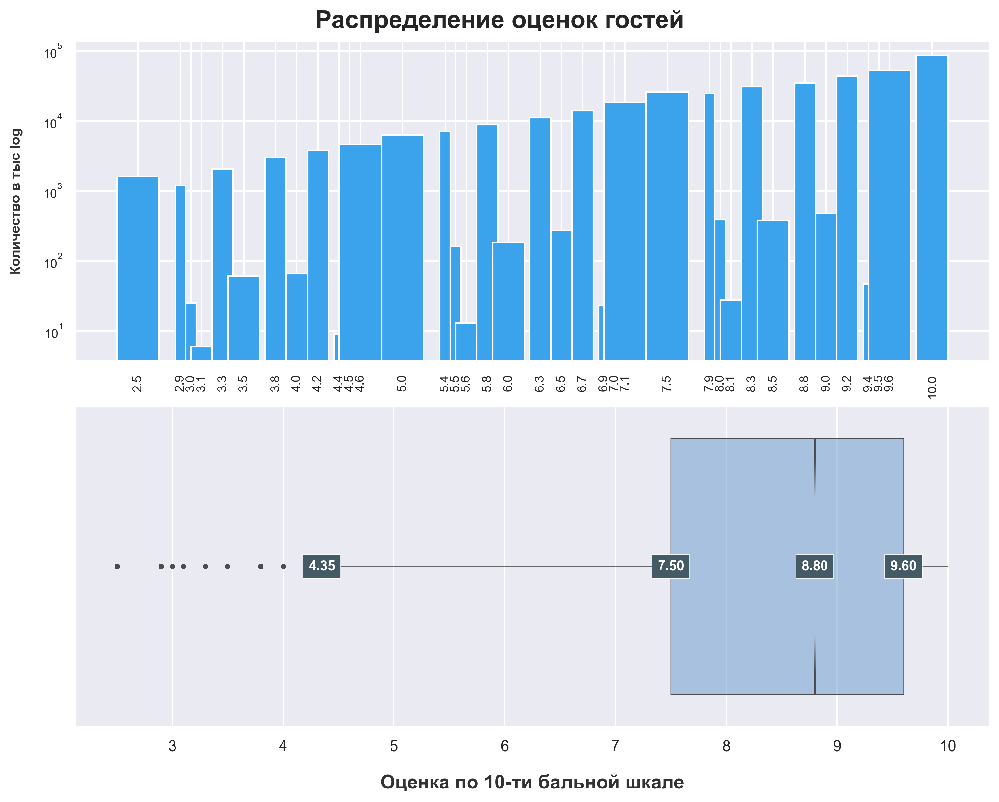

In [13]:
# немного магии, чтобы отобразить на гистограмме ширину столбиков, соответствующие 
# лэйблам по оси абсцисс
bins = sorted(np.append(df_train.reviewer_score.unique(),10.3))
# тут для удобства понимания данных, расположим оба графика сразу друг под другом
figure, (ax1, ax2) = plt.subplots(2, 1, figsize=(10,8), constrained_layout=True)

# Выставим тему и стиль для графиков
sns.set_theme(style="whitegrid", palette="pastel")

rc_style={'patch.edgecolor': 'w',
          'grid.color': '.8',
          'grid.linestyle': "-",
          }
sns.set(rc={"grid.linewidth":.3})
sns.set_style("darkgrid",rc_style)
counts, bins, patches = ax1.hist(data=df_train,
             x="reviewer_score",
             bins=bins, 
             color='#3ba3ec',
             align='left'
            );

sns.boxplot(
    data=df_train, x="reviewer_score",
    notch=True, showcaps=False,
    flierprops={"marker": "."},
    boxprops={"facecolor": (.4, .6, .8, .5)},
    medianprops={"color": "coral"},
    linewidth=.4,
    ax = ax2
);
# для пущей визуализации нанесем значения квантилей, медианы и нижнего заборчика
# на график, предварительно рассчитав их
q1 = df_train.reviewer_score.quantile([.25]).item()
q3 = df_train.reviewer_score.quantile([.75]).item()
iqr = q3 - q1
text_data = [
    df_train.reviewer_score.median(),
    q1,
    q3,
    q1 - 1.5 * iqr,
]

for t_data in text_data:
    ax2.text(
        # нанесем медианное значение на график
            t_data, 
            0, 
            f'{t_data:.2f}', 
            ha='center', 
            va='center', 
            fontweight='bold', 
            size=10,
            color='white',
            bbox=dict(facecolor='#445A64',linewidth = .4))

#modify individual font size of elements
plt.suptitle('Распределение оценок гостей', size = 18, weight = 600)
ax2.set_xlabel('Оценка по 10-ти бальной шкале', fontsize=14, labelpad = 15,
           fontdict = {'color' : '#323232', 'fontweight' : 600})
ax1.set_ylabel('Количество в тыс log', fontsize=10, labelpad = 15,
           fontdict = {'color' : '#323232', 'fontweight' : 600})
ax1.set_xlabel('')
ax1.tick_params(axis='both', which='major', labelsize=9)
# figure.tight_layout()
ax1.set_yscale("log")
ax1.tick_params(axis="x", labelrotation=90)
ticks = sorted(set(df_train.reviewer_score));


ax1.set_xticks(ticks)
ax1.set_xticklabels(ticks);


# graph.yaxis.set_major_formatter(ticker.FuncFormatter(lambda x, pos: '{:,.0f}'.format(x/1000) + ' тыс.'))

<span style="color:lightblue">Я прологарифмировал ось ординат, так как оказалось, что у нас есть оценки с очень маленьким кол-вом отзывов, чтобы их лучше было видно.
Например <span style="color:pink">3.1, 3.5, 4.4</span> Это может говорить, что оценки в десятичном виде посетители сами не выставляют, так как не было бы таких диких разбегов. Скорее всего это работа встроенного движка букинга, а может и ошибочные данные. Если исходит из того, что это ошибка, то можно играться с их удалением, но учитывая, что их кол-во невелико, и они находятся в допустимом диапазоне, то думаю нет смысла с ними что либо делать.

<span style="color:lightblue">Также из boxplot графика, мы видим что медианная оценка 8.8 и основной диапазон выставленных оценок находится между <span style="color:pink">7.5 и 9.6</span>
</span>

Еще раз взглянем на данные, сразу скажу, что глобально мне все нравится и нет смысла проверять каждый признак на наличие вылетов.

In [14]:
data.describe()

,additional_number_of_scoring,average_score,review_total_negative_word_counts,total_number_of_reviews,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,reviewer_score,sample
count,515738.000,515738.000,515738.000,515738.000,515738.000,515738.000,515738.000,515738.000
mean,498.082,8.397,18.539,2743.744,17.776,7.166,6.298,0.750
std,500.538,0.548,29.691,2317.465,21.804,11.040,3.902,0.433
min,1.000,5.200,0.000,43.000,0.000,1.000,0.000,0.000
25%,169.000,8.100,2.000,1161.000,5.000,1.000,0.625,0.250
50%,341.000,8.400,9.000,2134.000,11.000,3.000,7.900,1.000
75%,660.000,8.800,23.000,3613.000,22.000,8.000,9.600,1.000
max,2682.000,9.800,408.000,16670.000,395.000,355.000,10.000,1.000


И посмотрим что нам несут <span style="color:pink">не числовые признаки</span>

In [15]:
data[[col for col in data.columns if data[col].dtype == 'O']].head(3)

,hotel_address,review_date,hotel_name,reviewer_nationality,negative_review,positive_review,tags,days_since_review,lat,lng
0,Stratton Street Mayfair Westminster Borough London W1J 8LT United Kingdom,2/19/2016,The May Fair Hotel,United Kingdom,Leaving,Staff were amazing,"[' Leisure trip ', ' Couple ', ' Studio Suite ', ' Stayed 2 nights ', ' Submitted from a mobile device ']",531 day,51.508,-0.144
1,130 134 Southampton Row Camden London WC1B 5AF United Kingdom,1/12/2017,Mercure London Bloomsbury Hotel,United Kingdom,poor breakfast,location,"[' Business trip ', ' Couple ', ' Standard Double Room ', ' Stayed 1 night ']",203 day,51.521,-0.123
2,151 bis Rue de Rennes 6th arr 75006 Paris France,10/18/2016,Legend Saint Germain by Elegancia,China,No kettle in room,No Positive,"[' Leisure trip ', ' Solo traveler ', ' Modern Double Room Echo ', ' Stayed 3 nights ', ' Submitted from a mobile device ']",289 day,48.845,2.326


<span style="color:lightblue">Тут мы ничего сейчас детального сказать не можем, по ходу дела при работе с каждым из признаков и будем проверять его, и думать что и как делать.

<span style="color:lightblue">А в глобальном плане, выглядит нормально. Претензий пока нет
</span>

<a id = '2'></a>

<p style = "background-color : DarkGreen; border-radius: 5px 5px; padding : 10px"><strong>

# 2. Проектирование признаков (Feature Engineering)

</strong></p> 


In [16]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 515738 entries, 0 to 515737
Data columns (total 18 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   hotel_address                               515738 non-null  object 
 1   additional_number_of_scoring                515738 non-null  int64  
 2   review_date                                 515738 non-null  object 
 3   average_score                               515738 non-null  float64
 4   hotel_name                                  515738 non-null  object 
 5   reviewer_nationality                        515738 non-null  object 
 6   negative_review                             515738 non-null  object 
 7   review_total_negative_word_counts           515738 non-null  int64  
 8   total_number_of_reviews                     515738 non-null  int64  
 9   positive_review                             515738 non-null  object 
 

<span style="color:lightblue">
Изучая доступные признаки, видно, что мы можем разбить их на логические блоки и изучить по отдельности. <br>
</span>

Это признаки отвечающие за:<br>
* Местоположение обьекта (адрес)
* Дата (временной промежуток выставления оценок)
* Таги (смысловая словесная информация о проживании)
* Отзывы, и расчетные данные по ним, такие как кол-во слов в отзыве, сколько непроверенных отзывов оставлено и т.д
* Информация о рецензенте (страна проживания, кол-во отзывов оставленных данны человеком)

<br>
<span style="color:lightblue">
Пройдемся последовательно по каждому разделу. проанализируем и сделаем действия, которые нам покажутся верными
</span>

In [17]:
# Создадим список для удаления признаков, если нам по ходу дела какой-то из признаков не приглянется,
# занесем его в список, для последующего удаления.
drop_list = list()

<a id = '2.1'></a>

<p style = "background-color : DodgerBlue; border-radius: 5px 5px; padding : 10px"><strong>

## 2.1 Географическое расположение (hotel_address)

</strong></p> 


In [18]:
def get_random_data(df,feature, number = 10):
  """Выбирает рандомно указанное кол-во id в диапазоне от 0 до 
  размера передаваемого в функцию датасета и выводит указанный признак (признаки) 
  для отобранных id записей

  Args:
      df (pandas.Dataframe): датасет
      feature (str или list): признак/-и
      number (int, optional): кол-во записей для вывода. Defaults to 10.
  """
  random_list = random.sample(range(0, df.shape[0]-1), number)
  for idx in random_list:
    display(df.loc[idx][feature])

get_random_data(data,['hotel_address'], 5)


hotel_address    Lancaster Gate Westminster Borough London W2 3LG United Kingdom
Name: 40337, dtype: object

hotel_address    8 10 Queensberry Place Kensington and Chelsea London SW7 2EA United Kingdom
Name: 390168, dtype: object

hotel_address    Wiedner G rtel 14 04 Wieden 1040 Vienna Austria
Name: 279105, dtype: object

hotel_address    Hanger Lane Ealing London W5 3HL United Kingdom
Name: 344097, dtype: object

hotel_address    Opernring 11 01 Innere Stadt 1010 Vienna Austria
Name: 487271, dtype: object

<span style="color:lightblue">Например адрес : <span style="color:pink">Prinses Irenestraat 30 Zuideramstel 1077 WX Amsterdam Netherlands</span></span><br>
<span style="color:lightblue">Данные адреса отеля нам дают следующую информацию
* Адрес не обязательно на английском языке
* Строка адреса содержит название города
* Строка адреса содержит индекс
* Строка адреса содержит и непосредственно сам адрес

Вытащим данные данные из адресной информации и создадим новые признаки :
* Страна
* Город
* Индекс
</span>

<span style="color:lightblue">
И чтобы два раза не бегать, у нас есть координаты, заодно и высчитаем расстояние от центра города, до отеля

Потому как есть мысль, что рейтинг зависит от cовокупоности факторов расположения отеля, таких как страна, город, район (индекс), расстояние от центра. И раз у нас есть все данные, которые помогают нам это вычислить, то почему спрашивается, нам это не сделать ) </span>

In [19]:
# Создадим список со всеми отелями и их кординатами
hotels_with_coor = data.groupby(['hotel_address','lat','lng']).count().reset_index().iloc[:,:3].set_index('hotel_address')

# Выделим страну из адресной строки
hotels_with_coor.loc[:,'country'] = \
hotels_with_coor.loc[:].apply(lambda x : 'United Kingdom' if x.name.split()[-1] == 'Kingdom' else x.name.split()[-1], axis = 1)

# Выделим город из адресной строки
hotels_with_coor.loc[:,'city'] = hotels_with_coor.apply(lambda x: ','.join(x.name.split(' ')[-2:-1]), axis = 1)
hotels_with_coor.city = hotels_with_coor.city.apply(lambda x: 'London' if x == 'United' else x)

# Выделим почтовый из адресной строки
hotels_with_coor.loc[:,'post_index'] = \
  hotels_with_coor.apply(lambda x: x.name.strip().split()[-4] if x.country in ('United Kingdom','Netherlands') \
    else x.name.strip().split()[-3], axis = 1)


# Создадим отдельный датасет только одержащий уникальные города из датасета
city_coors = pd.DataFrame(hotels_with_coor.city.unique(), columns=['name'])

# используем библиотеку для работы с геокоординатами
geolocator = Nominatim(user_agent="AV_Kaggle")
geocode = RateLimiter(geolocator.geocode, min_delay_seconds=1)

# Получим координаты центров для представленных в базе городов
city_coors['lat'], city_coors['lng'] = zip(*city_coors.name.progress_apply(lambda x : geolocator.geocode(x)[1]))

# Создадим словарь с индексом название города и данными {lat,lng}
dict_city_locs = city_coors.set_index('name').to_dict('dict')

# Создадим в датафрейме отелей новый признак, координаты центра города, где отель находится
hotels_with_coor['center_lat'] = hotels_with_coor['city'].map(dict_city_locs['lat'])
hotels_with_coor['center_lng'] = hotels_with_coor['city'].map(dict_city_locs['lng'])

# расчитаем расстояние по прямой от координат отеля до центра города
hotels_with_coor['distance_from_center'] = hotels_with_coor.progress_apply(lambda x :\
  geodesic((x.lat,x.lng),(x.center_lat, x.center_lng)).kilometers, axis = 1)

# Создадим новый словарь с полученнми ранее данными
dict_hotel_extra = hotels_with_coor[['country','city','distance_from_center','post_index']].\
  to_dict('dict')

# Создадим новые признаки в основном датафрейме
data['city'] = data.hotel_address.map(dict_hotel_extra['city'])
data['country'] = data.hotel_address.map(dict_hotel_extra['country'])
data['post_index'] = data.hotel_address.map(dict_hotel_extra['post_index'])
data['distance_from_center'] = data.hotel_address.map(dict_hotel_extra['distance_from_center'])

print(f"{Fore.LIGHTBLUE_EX}\nУникальных стран:{Fore.LIGHTGREEN_EX} {', '.join(hotels_with_coor.country.unique())}")
print(f"{Fore.LIGHTBLUE_EX}\nУникальных городов:{Fore.LIGHTGREEN_EX} {', '.join(city_coors.name.values)}")
for key, item in hotels_with_coor.groupby(by=['city']).post_index.apply(list).to_dict().items():
  print(f"{Fore.LIGHTBLUE_EX}Город:{Fore.LIGHTGREEN_EX}{key}")
  print(f"{Fore.LIGHTWHITE_EX}Районы\n{Fore.LIGHTBLACK_EX}{', '.join(sorted(set(item)))}")


100%|██████████| 1493/1493 [00:00<00:00, 4036.23it/s]



Уникальных стран: Netherlands, United Kingdom, France, Spain, Italy, Austria

Уникальных городов: Amsterdam, London, Paris, Barcelona, Milan, Vienna
Город:Amsterdam
Районы
1011, 1012, 1013, 1014, 1015, 1016, 1017, 1018, 1019, 1031, 1033, 1043, 1052, 1053, 1054, 1055, 1057, 1058, 1062, 1064, 1066, 1067, 1071, 1072, 1075, 1077, 1082, 1083, 1087, 1091, 1092, 1093, 1096, 1097, 1101, 1105, 1108
Город:Barcelona
Районы
08001, 08002, 08003, 08004, 08005, 08006, 08007, 08008, 08009, 08010, 08011, 08012, 08013, 08014, 08015, 08017, 08018, 08019, 08021, 08022, 08023, 08025, 08026, 08028, 08029, 08034, 08035, 08036, 08037, 08038, 08039, 08040, 08950
Город:London
Районы
E1, E14, E15, E16, E1W, E2, E20, E8, EC1M, EC1R, EC1V, EC1Y, EC2A, EC2M, EC2R, EC3A, EC3N, EC3V, EC4M, EC4V, EC4Y, HA9, IG8, N1, N1C, N4, NW1, NW2, NW3, NW4, NW6, NW8, SE1, SE10, SE11, SE16, SW10, SW11, SW14, SW15, SW19, SW1A, SW1E, SW1H, SW1P, SW1V, SW1W, SW1X, SW1Y, SW3, SW5, SW6, SW7, SW8, W10, W11, W12, W13, W14, W1B, W1C, W1D,

<span style="color:lightblue">
Итак, мы имеем отели, представленные в 6 странах, по одному городу в каждой из стран. И с кучей почтовых адресов. Пока не знаю, что с ними делать, так как многие отели лишь по одному находятся в каждом из указанных почтовых индексов, поэтому думаю ценность этого признака под вопросом. Пусть пока будет, подумаю далее над этим
</span><br>
Проверим одну из наших теорий, что в разных городах и странах, разные средние значения оценок.

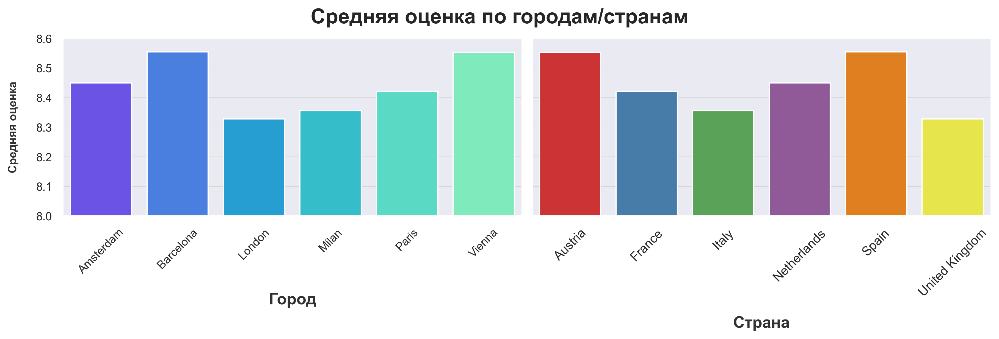

In [20]:
# тут для удобства понимания данных, расположим оба графика бок о бок
# благо городов и стран всего по 6, так что думаю смотрется должно презентативно

cities = pd.pivot_table(
    data=data[data['sample']==1],
    index='city', 
    values='reviewer_score', 
    aggfunc=['mean'])

countries = pd.pivot_table(
    data=data[data['sample']==1],
    index='country', 
    values='reviewer_score', 
    aggfunc=['mean'])

figure, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,4), constrained_layout=True, sharey=True)


sns.set(rc={"grid.linewidth":.3})
sns.set_style("darkgrid",rc_style)

ax1.set_ylim(8, 8.6);

pal1 = sns.color_palette("rainbow", 12)
sns.set_palette(pal1)

sns.barplot(x=cities.index, y=cities[('mean', 'reviewer_score')], ax=ax1);

pal2 = sns.color_palette("Set1", 12)
sns.set_palette(pal2)

sns.barplot(x=countries.index, y=countries[('mean', 'reviewer_score')], ax=ax2);
ax1.tick_params(axis='x', rotation=45)
ax2.tick_params(axis='x', rotation=45)
ax1.set_ylabel('Средняя оценка', fontsize=10, labelpad = 15,
           fontdict = {'color' : '#323232', 'fontweight' : 600})
ax1.set_xlabel('Город', fontsize=14, labelpad = 15,
           fontdict = {'color' : '#323232', 'fontweight' : 600})
ax2.set_xlabel('Страна', fontsize=14, labelpad = 15,
           fontdict = {'color' : '#323232', 'fontweight' : 600})
ax1.tick_params(axis='both', which='major', labelsize=10)

plt.suptitle('Средняя оценка по городам/странам', size = 18, weight = 600)
ax2.set_ylabel('');



<span style="color:lightblue">Понятное дело, что данные в обоих графиках будут идентичные, так как мы имеем случай, 1 страна с 1 городом. Но я тренировался с построением графиков, оттуда вот так вот )</span>
А так, видно, что средняя оценка меняется в зависимости от страны/города расположения отеля. Так что наличие данного признака не будет лишним. Единственное, что оставим только 1 из этих двух признаков, так как они повторяют друг друга

<span style="color:pink">
  Возвращаясь к теме почтовых индексов
</span><br>
<span style="color:lightblue">
Почтовый индекс, это хорошо, но он не привязан к районам, т.е. в одном районе, может быть несколько индексов, а если мы думаем, что расположение отеля может влиять на оценку, то хорошо бы передать моделе какой-то групповой признак района.

В вообщем я потратил немного времени сначала с openstreetmaps, и по геокоординатам вытащил названия районов по адресам, но мне не совсем понравилось данная тема, так как в разных городах, разный подход к административному делению на районы и где-то очень сильное дробление, где-то слабое. В Вообщем я еще отдельно изучил схемы городов и создал еще один признак района, так сказать с более глобальной структурой. Ниже из правил, вы можете сообразить какое деление будет в данном признаке.

А раойоны вытащенные с openstreetmap, я сохранил отдельно, так как процесс геокодинга занимает время и иногда вылетает, по причине нестабильности интернета или каких еще магнитых бурь, в виде админа с проводами в серверной.
</span>


In [21]:
# читаем сохраненные данные по районам, вытащенные с openstreetmap путем геокодинга
sub_df = pd.read_csv(EXTRA_DATA_DIR + 'suburbs.csv').set_index('hotel_address')
dict_suburb = sub_df[['suburb']].\
  to_dict('dict')
  
data['suburb'] = data.hotel_address.map(dict_suburb['suburb'])

# создаем правила, для каждого из городов, по определению района
# для каждого города разные принципы
london_rules = {
  '^EC' : 'East Central',
  '^E\d' : 'East London',
  '^N\d' : 'North London',
  '^NW' : 'North West London',    
  '^SE' : 'South East London',    
  '^SW' : 'South West London',    
  '^W\d' : 'West End London',    
  '^WC' : 'West Central London',  
}
vienna_rules = {
  '^101' : 'InnerStadt',
  '^10[2.9]' : 'Center',
}

barcelona_rules = {
  'Old City' :['08001','08002','08003','08039'],
  'Sants Mnotjuic' : ['08004','08014','08038','08040'],
  'Eixample' : ['08007','08008','08009','08010','08011','08012','08013','08015','08025','08029','08036','08037'],
  'Sant marti' : ['08005','08018','08019','08026'],
  'Gervasi' : ['08006','08017','08021','08022','08023','08034'],
  'Les Corts' : ['08028','08950'],
  'Guinardo' : ['08035'],
}

paris_rules = {
  'Heart' :['75001','75002'],
  'Marais' : ['75003','75004'],
  'District 5' :['75005'],
  'District 6' :['75006'],
  'District 7' :['75007'],
  'District 8' :['75008'],
  'District 9' :['75009'],
  'District 10' :['75010'],
  'District 11' :['75011'],
  'District 12' :['75012'],
  'District 13' :['75013'],
  'District 14' :['75014'],
  'District 15' :['75015'],
  'District 16' :['75016'],
  'District 17' :['75017'],
  'District 18' :['75018'],
  'District 19' :['75019'],
  'District 20' :['75020'],
}

milan_rules = {
  'Municipio 1': ['Municipio 1'],
  'Municipio 2': ['Municipio 2'],
  'Municipio 3': ['Municipio 3'],
  'Municipio 4': ['Municipio 4'],
  'Municipio 5': ['Municipio 5'],
  'Municipio 6' :['Municipio 6','Barona'],
  'Municipio 7' : ['Municipio 7','Quinto Romano'],
  'Municipio 8' :['Municipio 8','Boldinasco','Bullona','Cagnola','Garegnano',\
    'Ghisolfa','Musocco','Porta Volta','Portello','Tre Torri - Fiera','Villapizzone'],
  'Municipio 9': ['Municipio 9'],  
}

def main_neighborhoods_retreving(row):
  """Функция возвращает название района, согласно описанным выше правилам, для каждого города

  Args:
      row (Series): Строка из датасета

  Returns:
      string: Возвращаем название района
  """
  if row.city == 'London':
    for ind, key in london_rules.items():
      if re.match(ind,row.post_index):
        return key
  if row.city == 'Vienna':
    for ind, key in vienna_rules.items():
      if re.match(ind,row.post_index):
        return key 
    return 'Other'     
  if row.city == 'Barcelona':
    for ind, key in barcelona_rules.items():
      if row.post_index in key:
        return ind 
    return 'Other'    
  if row.city == 'Paris':
    for ind, key in paris_rules.items():
      if row.post_index in key:
        return ind 
    return 'Other'  
  if row.city == 'Milan':
    for ind, key in milan_rules.items():
      if row.suburb in key:
        return ind 
    return 'Other'   
  if row.city == 'Amsterdam':
      return row.suburb 
  else:
    return 'Other'    
  
  return 'Unknown'  
# создаем новый признак района
data['neighborhood'] = data.progress_apply(main_neighborhoods_retreving, axis = 1)

100%|██████████| 515738/515738 [00:29<00:00, 17655.88it/s]


In [22]:
# Выберем информацию о отелях и визуализируем на карте мира 
hotels_with_coor = data.drop_duplicates(subset = ['hotel_address','hotel_name','lat','lng', 'neighborhood','post_index', 'suburb'])

fig = px.scatter_mapbox(hotels_with_coor.reset_index().reset_index(), lat="lat", lon="lng", 
                        hover_name='neighborhood', 
                        hover_data=['neighborhood','suburb','post_index'],
                        zoom=5,
                        height=600,
                        center={'lat':48,'lon':8.5},
                        opacity=0.9,
                        color='neighborhood',

                        )


fig.update_layout(mapbox_style="open-street-map",
                  margin={"r":0,"t":0,"l":0,"b":0},
                  showlegend = False)

fig.update_traces(
                  mode="markers", 
                  marker_size=12,
                  hovertemplate="".join([
                          "Район: %{customdata[0]}",
                          "<br>",
                          "Ареал: %{customdata[1]}",
                          "<br>",
                          "Почтовый индекс: %{customdata[2]}",
                      ]),  
                  hoverlabel_namelength = 0, # убираем вывод ховера справа, он не очень красив по мне                 
)
fig.show()

<span style="color:lightblue">
На данный момент, я удовлетворен, как адреса разбиты по районам. Надеюсь это принесет какую-то пользу позже. Визуализируем среднюю оценку, в зависимости от района и ареала.
</span>

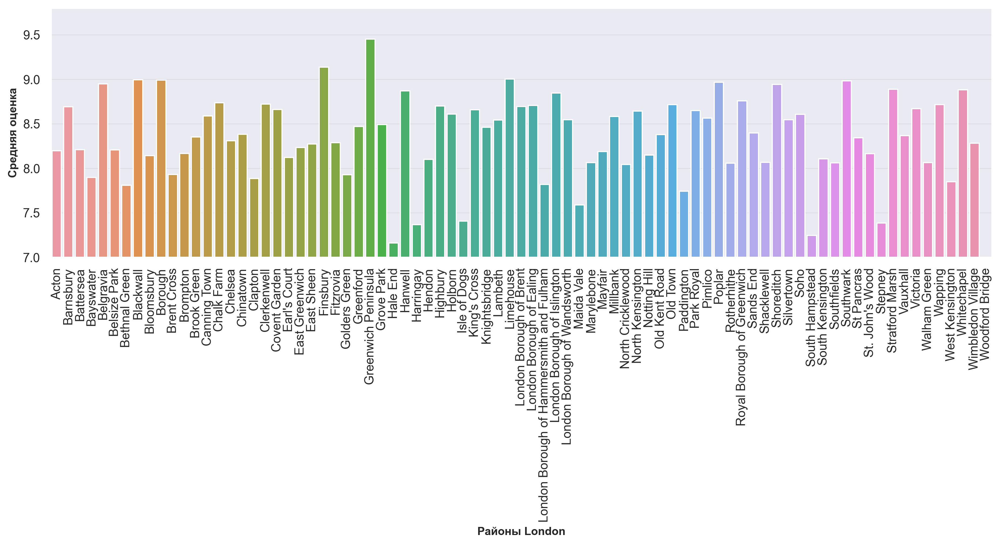

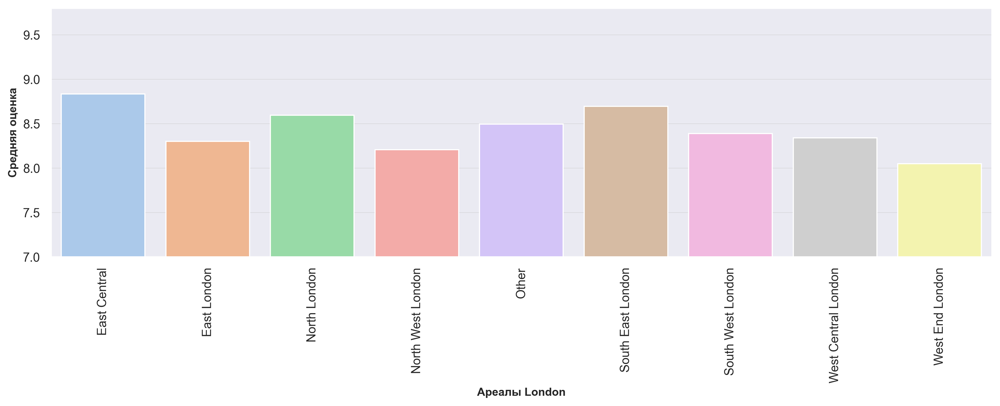

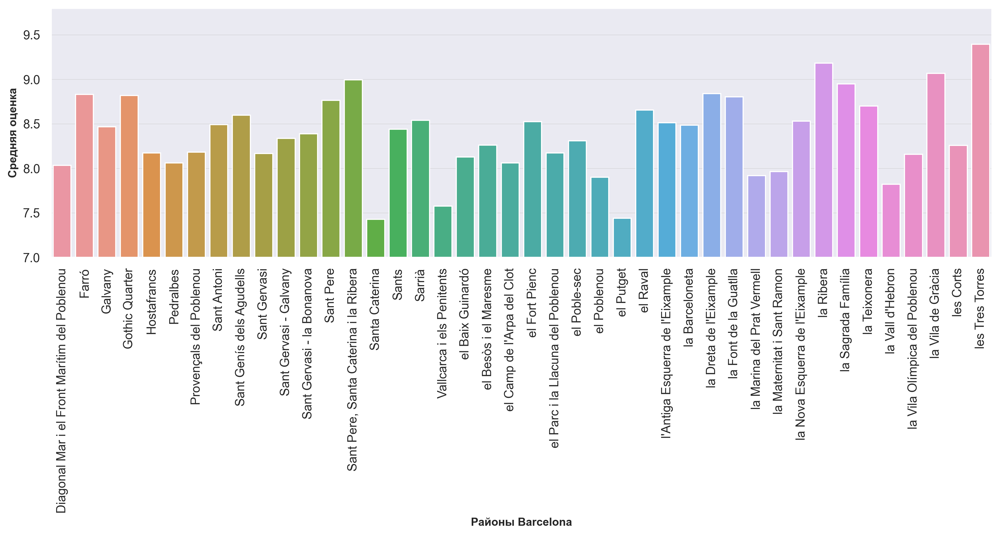

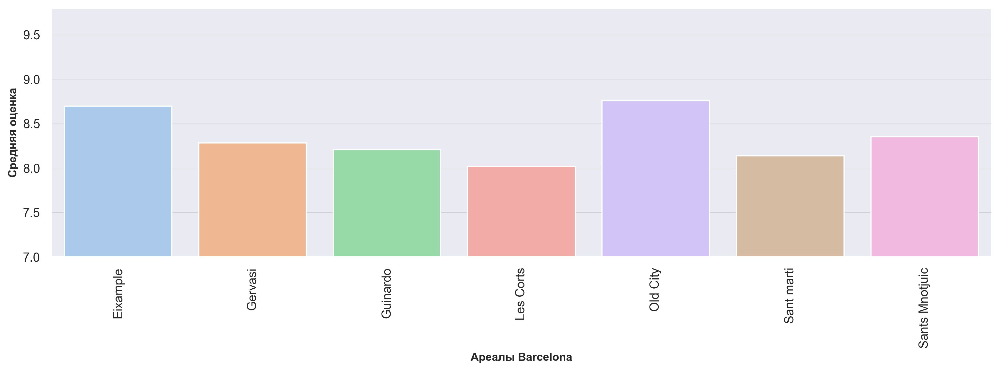

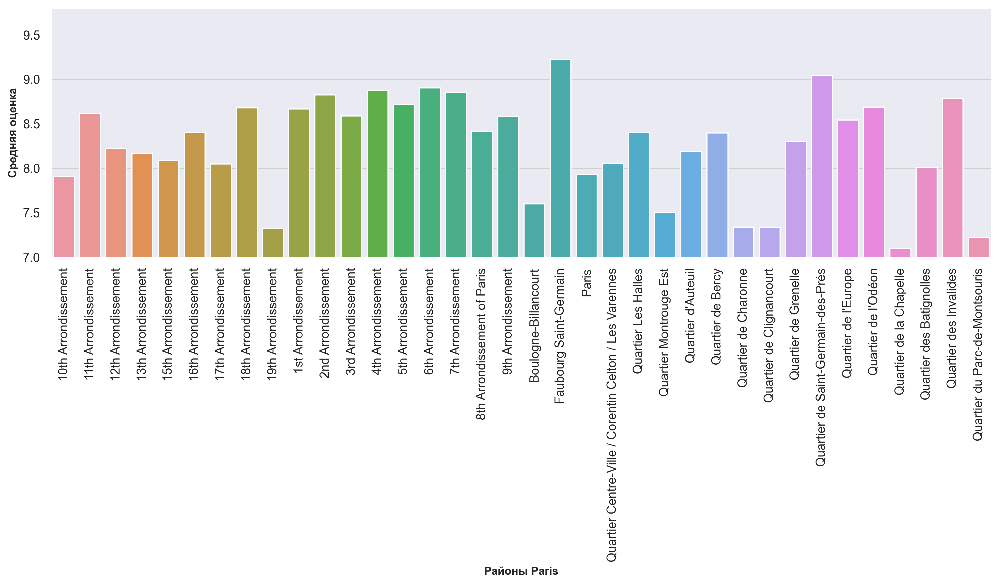

...

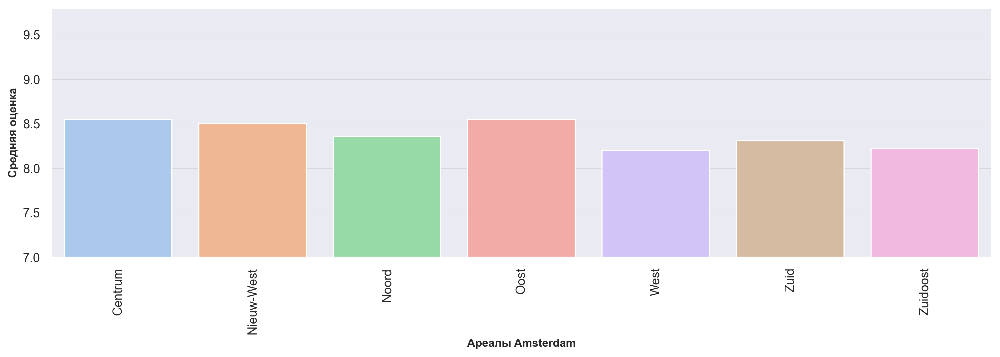

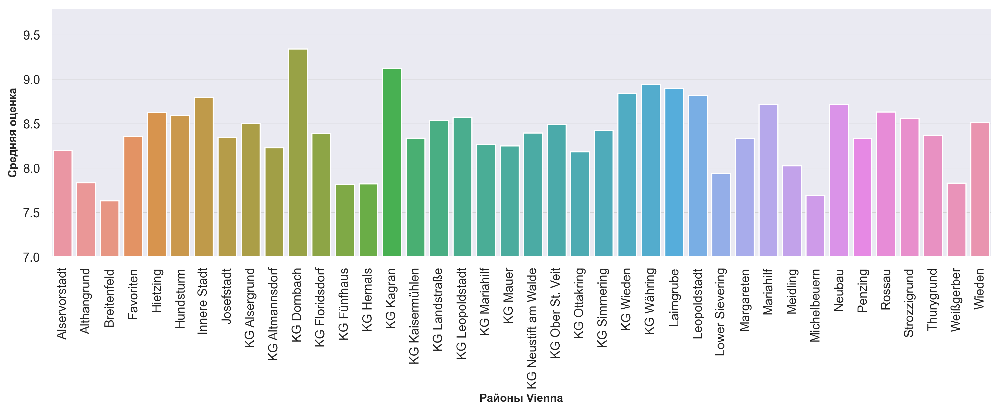

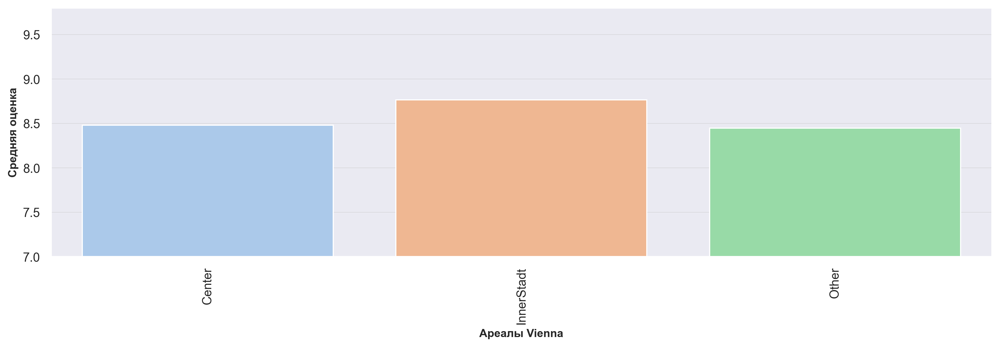

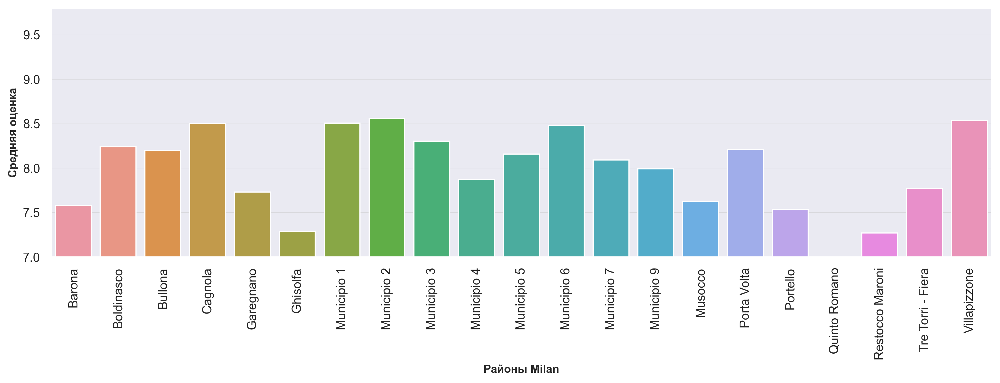

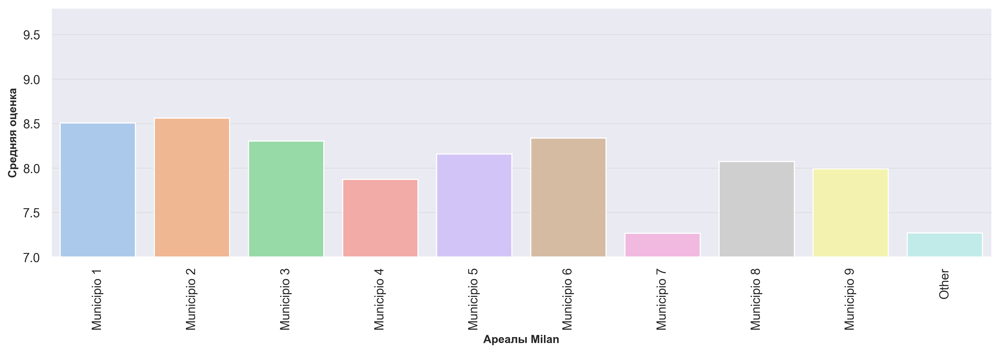

In [23]:
def histogram_graph_show(X_label, Y_label, df):

    fig, ax = plt.subplots(figsize=(15, 4))

    pal1 = sns.color_palette("pastel")
    sns.set_palette(pal1)

    sns.barplot(x=df.index, y=df[('mean', 'reviewer_score')]);
    ax.tick_params(axis='x', rotation=90)
    ax.set_ylabel(Y_label, fontweight='bold', fontsize=10)
    ax.set_xlabel(X_label, fontweight='bold', fontsize=10)
    plt.ylim(7, 9.8);
    plt.show()


city_list = list(data.city.value_counts().index)

for city in city_list:
    temp_df = pd.pivot_table(
                            data=data[(data['sample']==1) & (data.city == city)],
                            index=['suburb'], 
                            values='reviewer_score', 
                            aggfunc=['count', 'mean'])
    histogram_graph_show('Районы ' + city,'Средняя оценка', temp_df)
    temp_df = pd.pivot_table(
                            data=data[(data['sample']==1) & (data.city == city)],
                            index=['neighborhood'], 
                            values='reviewer_score', 
                            aggfunc=['count', 'mean'])
    histogram_graph_show('Ареалы ' + city,'Средняя оценка', temp_df)    


<span style="color:lightblue">
Как видно из графиков, оценка от района скачет, так что думаю эти полученные признаки должны влиять на улучшение результата моделирования предсказания оценки
</span>

И раз мы посчитали расстояние от центра города, до отеля, то можно закончить данный раздел, последним графиком, показывающим среднюю оценку от данного признака

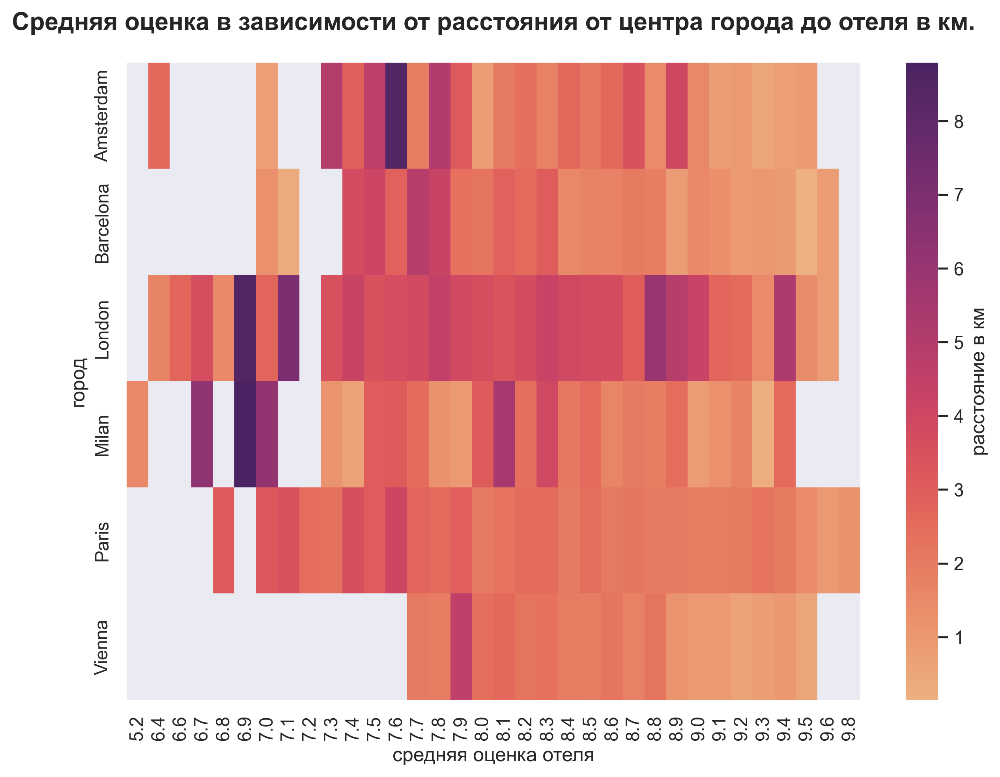

In [24]:
pivot_distance = data[data['sample']==1].pivot_table(
    values='distance_from_center',
    columns='average_score',
    index='city')
pivot_distance.columns = pivot_distance.columns.astype('string')
fig, ax = plt.subplots(figsize=(10,7))    
heatmap = sns.heatmap(data=pivot_distance, cmap='flare', 
                      cbar_kws={'label': 'расстояние в км'})
heatmap.set_title('Средняя оценка в зависимости от расстояния от центра города до отеля в км.',
                  fontsize=15, fontweight='bold', pad=20);
heatmap.set_xlabel('средняя оценка отеля');
heatmap.set_ylabel('город');

<span style="color:lightblue">
Карта неоднородная, т.е разница, хоть и небольшая, но и по городам отличается, и скачет от расстояния.
Может и будет от этого признака толк...
</span>


<a id = '2.2'></a>

<p style = "background-color : DodgerBlue; border-radius: 5px 5px; padding : 10px"><strong>

## 2.2 Анализ дат (review_date)

</strong></p> 


<span style="color:lightblue">
Есть признак, дата отзыва. В данный момент, этот признак типа обьект, грубо говоря строка для нас, и соответственно не несет в себе никаких опций типа дата.

Приведем данный признак к типу дата, и можем выделить из этого такие данные как год, месяц, день. Возможно есть сезонные колебания оценок
</span>

In [27]:
data.review_date.info()

<class 'pandas.core.series.Series'>
RangeIndex: 515738 entries, 0 to 515737
Series name: review_date
Non-Null Count   Dtype 
--------------   ----- 
515738 non-null  object
dtypes: object(1)
memory usage: 3.9+ MB


In [28]:
# Создадим новые признаки из даты: год, месяц, день
data['review_date'] = pd.to_datetime(data['review_date'])
data['month']=pd.to_datetime(data['review_date']).dt.month
data['year']=pd.to_datetime(data['review_date']).dt.year
data['day']=pd.to_datetime(data['review_date']).dt.day


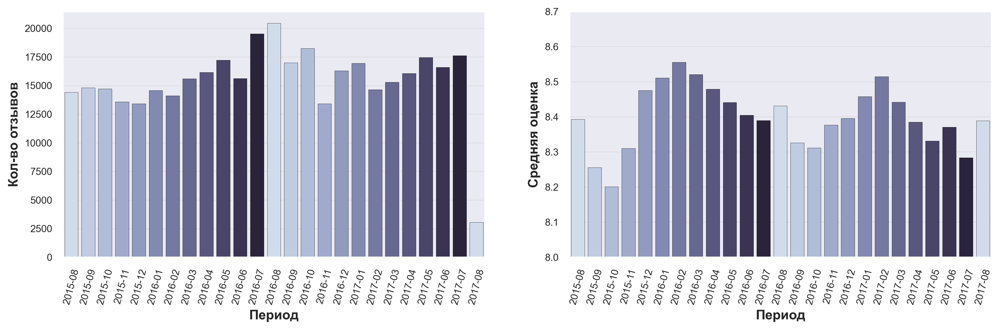

In [29]:
# Создадим еще один признак из даты, год и месяц в одном лице
data['review_period'] = data['review_date'].dt.to_period("M")

# Соберем данные для визулизации

period = data[data['sample']==1].pivot_table(
    values='reviewer_score',
    index='review_period',
    aggfunc=['mean', 'count']
)

rc_style={'patch.edgecolor': 'black',
          'grid.color': '.8',
          'grid.linestyle': "-",
          }
sns.set_style("darkgrid",rc_style)

clr = sns.color_palette("ch:s=.15,rot=-.15",12)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 4))
sns.barplot(x=period.index, y=period[('count', 'reviewer_score')], ax=ax1, palette=clr, linewidth=.2);

ax1.set_ylabel('Кол-во отзывов', fontweight = 600, fontsize = 12);

ax1.tick_params(axis='x', rotation=75)

sns.barplot(x=period.index, y=period[('mean', 'reviewer_score')], ax=ax2, palette=clr, linewidth=.2);
ax2.set_ylabel('Средняя оценка', fontweight = 600, fontsize = 12);
ax2.tick_params(axis='x', rotation=75)

ax1.set_xlabel('Период', fontweight = 600, fontsize = 12);
ax2.set_xlabel('Период', fontweight = 600, fontsize = 12);

ax1.tick_params(axis='both', which='major', labelsize=9)
ax2.tick_params(axis='both', which='major', labelsize=9)

plt.ylim(8, 8.7)
plt.show()

<span style="color:lightblue">
В данных наблюдается цикличность, т.е каждый определенный месяц нового года, ситуация схожа с аналогичным периодом предыдущего года. Думаю данные признаки нам тоже могут пригодится
</span>

In [30]:
# так как из данного признака мы все необходимое выстащили в новые признаки, страый признак нам не нужен
drop_list.append('review_date')

<a id = '2.3'></a>

<p style = "background-color : DodgerBlue; border-radius: 5px 5px; padding : 10px"><strong>

## 2.3 Анализ тегов (tags)

</strong></p> 



In [31]:
# Посмотрим что у нас творится с тагами, какая информация там скрывается
tags = set()
tags_list = list()
for index, value in data['tags'].items():
        pre_tags = value
        pre_tags = pre_tags.replace('[', '').replace(']', '')
        pre_tags = pre_tags.replace("'", '')
        pre_tags = pre_tags.split(",")
        for i in pre_tags:
            tags.add(i.strip())
            tags_list.append(i.strip())

print(Fore.LIGHTCYAN_EX + "\nУникальное количество тагов:" + Fore.LIGHTGREEN_EX, len(tags))
print(Fore.LIGHTCYAN_EX +"\nВсего тагов:" + Fore.LIGHTGREEN_EX, len(tags_list))   


Уникальное количество тагов: 2428

Всего тагов: 2356592


In [32]:
# Посмотрим на самые популярные таги
tags_series = pd.Series(
    data = tags_list,
    index = tags_list,
    name = 'tags_series'
)
print(Fore.LIGHTCYAN_EX + "\nTop 20 популярных тагов:", "\n")
print(tags_series.value_counts()[:20]) 


Top 20 популярных тагов: 

Leisure trip                      417778
Submitted from a mobile device    307640
Couple                            252294
Stayed 1 night                    193645
Stayed 2 nights                   133937
Solo traveler                     108545
Stayed 3 nights                    95821
Business trip                      82939
Group                              65392
Family with young children         61015
Stayed 4 nights                    47817
Double Room                        35207
Standard Double Room               32248
Superior Double Room               31393
Family with older children         26349
Deluxe Double Room                 24823
Double or Twin Room                22393
Stayed 5 nights                    20845
Standard Double or Twin Room       17483
Classic Double Room                16989
Name: tags_series, dtype: int64


Поверхностный взгляд дает нам понять, что таги содержать как минимум несколько типов информации :
* кол-во проведенных дней
* в какой группе путешествовал человек
* тип поездки

Проверим, одинаковое ли кол-во тагов у каждой записи, т.е. унифицированны ли эти данные, и мы можем ожидать что вся типовая информация есть исключительно для каждой записи

In [33]:
data['temp_tag_count'] = data.tags.progress_apply(lambda x : x[2:-2].split(',').__len__())

100%|██████████| 515738/515738 [00:00<00:00, 573050.36it/s]


In [34]:
# к сожалению, желания мои не оправдались. Тэг может включать в себя не всю информацию
data.temp_tag_count.value_counts()

5    297823
4    211564
3      5505
6       755
2        85
1         6
Name: temp_tag_count, dtype: int64

Я поизучал теги, и мне показалось правильным выделить следующие признаки.
* тип поездки
* как информация была занесена в букинг
* в какой компании путешествовали 
* было ли домашнее животное с собой
* было ли окно в номере
* тип комнаты (тут я опирался больше не на размер, а на класс комнаты)
* продолжительность остановки в отеле

In [35]:
rule_type = ['Leisure trip','Business trip']
rule_submit = ['Submitted from a mobile device']
rule_travellers = ['Couple','Solo traveler','Group','Travelers with friends','Family with older children','Family with young children']
rule_with_pet = ['With a pet']

def extract_data(row, feature_name, rules):
  """Функция, которая для указанного признака возвращает значения признака, согласно 
  установленным выше правилам

  Args:
      row (str): Строка содержащая tag
      feature_name (str): название признака
      rules (list): правило

  Returns:
      int/str/np.nan: В зависимости от правил, возвращает значение для признака
  """
  if feature_name == 'trip_type':
    for rule in rules:
      if rule in row:
        return rule
    else:
      return np.nan
  if feature_name == 'sumbit_type':
    for rule in rules:
      if rule in row:
        return 1
    else:
      return 0
  if feature_name == 'travellers_type':
    for rule in rules:
      if rule in row:
        if rule in ['Group', 'Travelers with friends']:
          return 'Group'
        elif rule == 'Couple':
          return 'Couple'
        elif rule == 'Solo traveler':
          return 'Solo'
        elif rule == 'Family with older children':
          return 'Family with older children'
        elif rule == 'Family with young children':
          return 'Family with young children'        
    else:
      return np.nan    
  if feature_name == 'with_pet_type':
    for rule in rules:
      if rule in row:
        return 1
    else:
      return 0
  if feature_name == 'with_view':
    if re.search(r'with.+view|panoram|observatory', row, flags=re.IGNORECASE):
        return 1
    else:
      return 0    
  if feature_name == 'without_window':
    if re.search(r'without.+window', row, flags=re.IGNORECASE):
        return 1
    else:
      return 0       

data['trip_type'] = data.tags.apply(lambda x : extract_data(x,'trip_type',rule_type))
data['sumbit_type'] = data.tags.apply(lambda x : extract_data(x,'sumbit_type',rule_submit))
data['travellers_type'] = data.tags.apply(lambda x : extract_data(x,'travellers_type',rule_travellers))
data['with_pet_type'] = data.tags.apply(lambda x : extract_data(x,'with_pet_type',rule_with_pet))
data['with_view'] = data.tags.apply(lambda x : extract_data(x,'with_view',[]))
data['without_window'] = data.tags.apply(lambda x : extract_data(x,'without_window',[]))
 

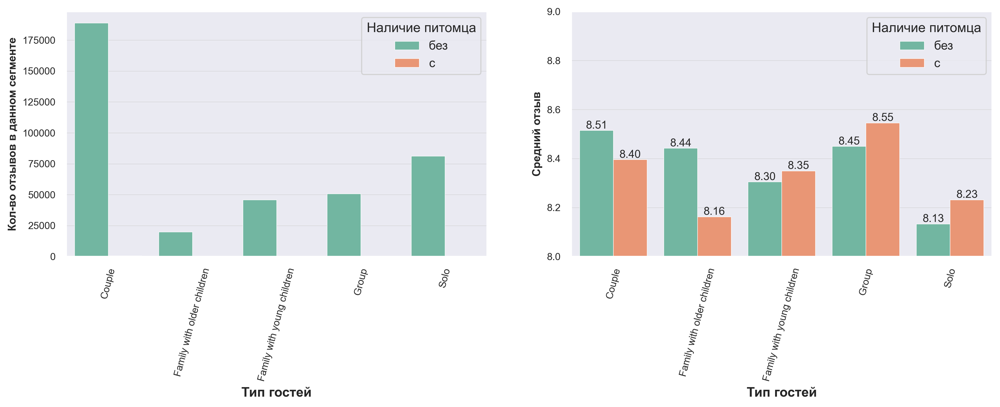

In [36]:
traveller_type = pd.pivot_table(
    data=data[data['sample'] == 1],
    index=['travellers_type','with_pet_type'], 
    values=['reviewer_score'], 
    aggfunc=['count', 'mean']).reset_index('with_pet_type')

traveller_type.with_pet_type = traveller_type.with_pet_type.apply(lambda x : 'без' if x == 0 else 'с')

rc_style={'patch.edgecolor': 'w',
          'grid.color': '.8',
          'grid.linestyle': "-",
          }
sns.set_style("darkgrid",rc_style)


xticklabels_guest = ["Couple", "Family with older children", \
    "Family with young children", "Group","Solo"]
# plotting bar graphs of the relationship reviwer score and type of guests
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 4))

pal2 = sns.color_palette("Set2", 12)
sns.set_palette(pal2)

sns.barplot(x=traveller_type.index, y=traveller_type[('count', 'reviewer_score')], ax=ax1,
            hue = traveller_type.with_pet_type, linewidth = .4);
ax1.set_xticklabels(xticklabels_guest, fontsize = 10, rotation = 75)
ax1.set_ylabel('Кол-во отзывов в данном сегменте', fontweight='bold', fontsize=10)

bar_rooms = sns.barplot(x=traveller_type.index, 
            y=traveller_type[('mean', 'reviewer_score')], ax=ax2,
            hue = traveller_type.with_pet_type, linewidth = .4);
ax2.set_ylabel('Средний отзыв', fontweight='bold', fontsize=10)
ax2.set_xticklabels(xticklabels_guest, fontsize = 10,  rotation = 75)

ax1.set_xlabel('Тип гостей', fontweight = 600, fontsize = 12);
ax2.set_xlabel('Тип гостей', fontweight = 600, fontsize = 12);

ax1.legend(title = 'Наличие питомца')
ax2.legend(title = 'Наличие питомца')

for p in bar_rooms.patches:
    bar_rooms.annotate(
    '{:.2f}'.format(p.get_height()), (p.get_x()+0.2, p.get_height()),
    ha='center', va='bottom', fontsize=10)

ax1.tick_params(axis='both', which='major', labelsize=9)
ax2.tick_params(axis='both', which='major', labelsize=9)

plt.ylim(8, 9);
plt.show()

<span style="color:lightblue">
Глядя на левый график, мы видим что кол-во отзывов путешественников с питомцами, очень мало. Так что скорее всего данный признак будет очень слабо влиять на модель, хотя в правом графике мы видим, что разница в оценках есть. Но опять же, слишком мало отзывов от таких путешественников
</span>

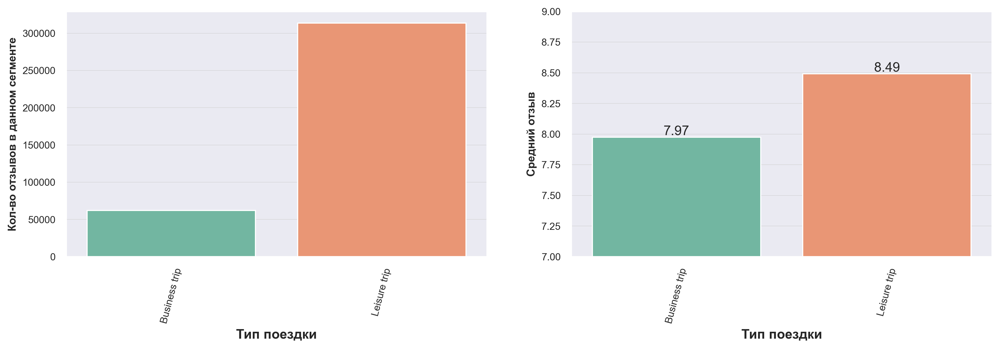

In [37]:
travel_type = pd.pivot_table(
    data=data[data['sample'] == 1],
    index='trip_type', 
    values='reviewer_score', 
    aggfunc=['count', 'mean'])

xticklabels_guest = ["Business trip", "Leisure trip"]
# plotting bar graphs of the relationship reviwer score and type of guests
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 4), linewidth = .4)

pal2 = sns.color_palette("Set2", 12)
sns.set_palette(pal2)

sns.barplot(x=travel_type.index, y=travel_type[('count', 'reviewer_score')], ax=ax1);
ax1.set_xticklabels(xticklabels_guest, fontsize = 10, rotation = 75)
ax1.set_ylabel('Кол-во отзывов в данном сегменте', fontweight='bold', fontsize=10)

bar_rooms = sns.barplot(x=travel_type.index, y=travel_type[('mean', 'reviewer_score')], ax=ax2);
ax2.set_ylabel('Средний отзыв', fontweight='bold', fontsize=10)
ax2.set_xticklabels(xticklabels_guest, fontsize = 10,  rotation = 75)

for p in bar_rooms.patches:
    bar_rooms.annotate(
    '{:.2f}'.format(p.get_height()), (p.get_x()+0.4, p.get_height()),
    ha='center', va='bottom', fontsize=12)

ax1.set_xlabel('Тип поездки', fontweight = 600, fontsize = 12);
ax2.set_xlabel('Тип поездки', fontweight = 600, fontsize = 12);

ax1.tick_params(axis='both', which='major', labelsize=9)
ax2.tick_params(axis='both', which='major', labelsize=9)

plt.ylim(7, 9);
plt.show()

In [38]:
# У нас есть пропуски в поле trip_type, заполним модой
data.loc[data[data.trip_type.isna()].index,'trip_type'] = data.trip_type.mode().item()

<span style="color:lightblue">
Основные посетители, это путешествующие люди, а не бизнес поездки. И как обычно, разница в средних оценках присутствует. Люди по бизнесу менее счастивы от посещения отелей
</span>

In [39]:
# Функция убирающая пробелы, аппострофы в строке тагов и приводящая строку к списку тагов
def tagsToList(value):
  val = re.sub(r"\s'\s|\s\'", '',value[2:-2].strip()).split(',') 
  return val

tags_temp_df = data.tags.progress_apply(tagsToList).to_frame()

tags = np.unique(np.hstack(tags_temp_df['tags'])).tolist()
tags_df = pd.DataFrame(tags, columns=['tag'])

100%|██████████| 515738/515738 [00:03<00:00, 134350.63it/s]


In [40]:
def tags_remove_from_list(tag_set_full, tag_set_diff):
  """Опираясь на правила в regular expressions выявляем классы комнат из датасета, содержащего все таги.
  После вычленения очередных тагов, возвращаем датасет тагов с удаленными записями вычлененных на
  данном шаге тагов

  Args:
      tag_set_full (pandas.Dataframe): начальный датасет
      tag_set_diff (pandas.Dataframe): датасет, значения из которого надо вычесть из начального датасета

  Returns:
      pandas.Dataframe: Результирующий датасет
  """
  return pd.DataFrame(set(tag_set_full.tag).difference(set(tag_set_diff.tag)),columns=['tag'])

tags_df = tags_remove_from_list(tags_df,pd.DataFrame((rule_type + rule_submit + rule_travellers + rule_with_pet), columns=['tag']))
# правило для вычленения продолжительности остановки в отеле
tags_stayed_days = tags_df[tags_df.tag.str.contains('stay.+\s+night', regex=True, case=False)]
tags_df = tags_remove_from_list(tags_df,tags_stayed_days)
room_type_deluxe_with_view = tags_df[tags_df.tag.str.contains('deluxe', regex=True, case=False)]
tags_df = tags_remove_from_list(tags_df,room_type_deluxe_with_view)
room_type_economy = tags_df[tags_df.tag.str.contains('economy|^small|mini.+room|compact|basic', regex=True, case=False)]
tags_df = tags_remove_from_list(tags_df,room_type_economy)
room_type_standard = tags_df[tags_df.tag.str.contains('standard|classic', regex=True, case=False)]
tags_df = tags_remove_from_list(tags_df,room_type_standard)
room_type_apartment = tags_df[tags_df.tag.str.contains('Apartement|Apartment', regex=True, case=False)]
tags_df = tags_remove_from_list(tags_df,room_type_apartment)
room_type_business = tags_df[tags_df.tag.str.contains('Business', regex=True, case=False)]
tags_df = tags_remove_from_list(tags_df,room_type_business)
room_type_executive = tags_df[tags_df.tag.str.contains('executive', regex=True, case=False)]
tags_df = tags_remove_from_list(tags_df,room_type_executive)
room_type_premier = tags_df[tags_df.tag.str.contains('premier|privilege|premium|prestige|president', regex=True, case=False)]
tags_df = tags_remove_from_list(tags_df,room_type_premier)
room_type_comfort = tags_df[tags_df.tag.str.contains('comfort|superior|deluxe|luxury|large|cosy|romantic|royal|cozy|confort|exclusive|fabulous|special|sensation|wonderful|emotion|club|art', regex=True, case=False)]
tags_df = tags_remove_from_list(tags_df,room_type_comfort)

# создаем словарь тагов, гле индекс класс комнаты, значения список тагов попадающих под это определение
room_classes = {'standard' : set(room_type_standard.tag), 'apartament' : set(room_type_apartment.tag), 'business' : set(room_type_business.tag),\
  'executive' : set(room_type_executive.tag), 'premier' : set(room_type_premier.tag), 'comfort' : set(room_type_comfort.tag)}

def get_room_class(tag):
  """Определяем какая запись в поле таг относится к классу комнаты,
  и согласно полученному выше списку возвращается индекс словаря, а именно класс комнаты

  Args:
      tag (str): значение тага

  Returns:
      str: класс комнаты
  """
  for idx, room_class in room_classes.items():
    for r_class in room_class:
      if r_class in tag:
        return idx
  return 'standard'

data['room_class'] = data.tags.progress_apply(get_room_class)

100%|██████████| 515738/515738 [00:52<00:00, 9882.37it/s] 


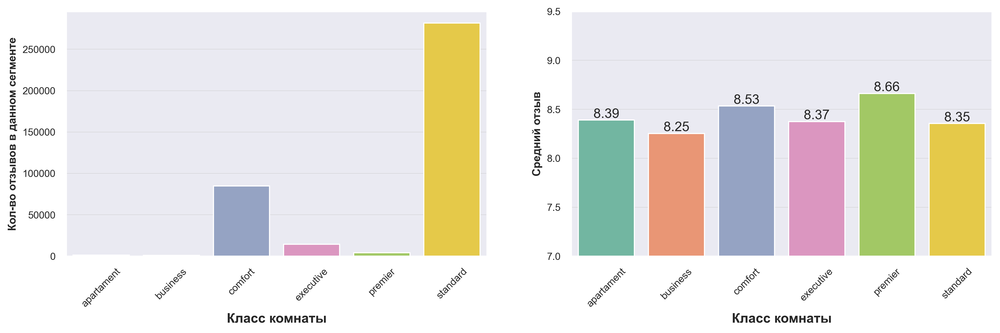

In [41]:
room_class= pd.pivot_table(
    data=data[data['sample']==1],
    index='room_class', 
    values='reviewer_score', 
    aggfunc=['count', 'mean'])


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 4), linewidth = .4)
sns.barplot(x=room_class.index, y=room_class[('count', 'reviewer_score')], ax=ax1);
ax1.set_ylabel('Кол-во отзывов в данном сегменте', fontweight ='bold', fontsize = 10)
ax1.tick_params(axis='x', rotation=45)

bar_rooms = sns.barplot(x=room_class.index, y=room_class[('mean', 'reviewer_score')], ax=ax2);
ax2.set_ylabel('Средний отзыв', fontweight ='bold', fontsize = 10)
ax2.tick_params(axis='x', rotation=45)
plt.ylim(7, 9.5);

for p in bar_rooms.patches:
    bar_rooms.annotate(
    '{:.2f}'.format(p.get_height()), (p.get_x()+0.4, p.get_height()),
    ha='center', va='bottom', fontsize=12)

ax1.set_xlabel('Класс комнаты', fontweight = 600, fontsize = 12);
ax2.set_xlabel('Класс комнаты', fontweight = 600, fontsize = 12);

ax1.tick_params(axis='both', which='major', labelsize=9)
ax2.tick_params(axis='both', which='major', labelsize=9)
    
plt.show()

<span style="color:lightblue">
Идей по выделению данных в новые признаки, относительно типа комнаты у меня было много. Потому как нет четких определений классов номера. После изучения данной темы, я обнаружил что в отличии от страны, отеля и т.д они сильно варьируются. В конечной моей работе, я добавил несколько других подходов по выявлению новых признаков из инфорации о номере

Из данного графика мы вроде видим красивую картину справа, данные разнятся, как бы все красиво, а вот слева все упирается в кол-во отзывов, а они практически все в одном сегменте - Standard. И это сводит на нет ценность данного выявленного признака.
</span>

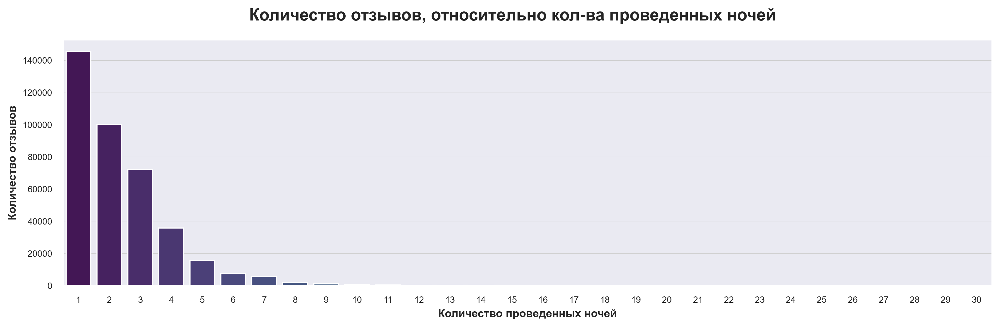

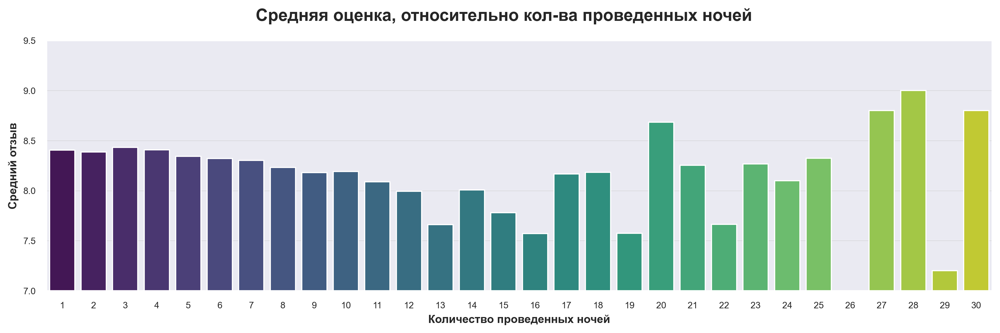

In [42]:
def extract_number_nights(tags):
    """Получаем кол-во дней проведенных постояльцем из записи Tags
    Args:
        tags (str): строка tags
    Returns:
        int : Количество дней
    """ 
    express = re.findall(r'Stayed\s([0-9]+)\snight', tags)
    for elem, num in enumerate(express):
        return np.int8(num)

# получаем новый признак, кол-во проведенных ночей
data['count_nights'] = data['tags'].apply(extract_number_nights)
# там где не указана продолжительность остановки, заполняем модой
mode_night = data['count_nights'].mode()[0]
data['count_nights'] = data['count_nights'].fillna(mode_night)
data['count_nights'] = data['count_nights'].astype('int8')

pivot_nights = pd.pivot_table(
    data=data[data['sample']==1],
    index='count_nights', 
    values='reviewer_score', 
    aggfunc=['count', 'mean']
)

fig, ax = plt.subplots(figsize=(15, 4))
clr = sns.color_palette("viridis",31)
plt.suptitle('Количество отзывов, относительно кол-ва проведенных ночей', 
             fontweight ='bold', size=15)
sns.barplot(x=pivot_nights.index, y=pivot_nights[('count', 'reviewer_score')], palette=clr)
plt.xlabel('Количество проведенных ночей', 
           fontweight ='bold', fontsize = 10)
plt.ylabel('Количество отзывов', fontweight ='bold', fontsize = 10)
ax.tick_params(axis='both', which='major', labelsize=8)

fig1, ax1 = plt.subplots(figsize=(15, 4))
plt.suptitle('Средняя оценка, относительно кол-ва проведенных ночей', 
             fontweight ='bold', size=15)
sns.barplot(x=pivot_nights.index, y=pivot_nights[('mean', 'reviewer_score')],palette=clr)
plt.xlabel('Количество проведенных ночей', 
           fontweight ='bold', fontsize = 10)
plt.ylabel('Средний отзыв', fontweight ='bold', fontsize = 10)
plt.ylim(7, 9.5)
ax1.tick_params(axis='both', which='major', labelsize=8)


plt.show()


In [43]:
# резанем по живому, все что мнеьше или равно 8-ми ночей, приравняем к 8
data.count_nights = data.count_nights.progress_apply(lambda x: 8 if x >= 8 else x)

100%|██████████| 515738/515738 [00:00<00:00, 932922.57it/s] 


<span style="color:lightblue">
Думаю что данный признак сильно большой ценности не несет в себе. Как видно из верхнего графика, после 7 проведенных ночей, кол-во отзывов стремится к нулю. Что можно также видеть на графике снизу, до 7 дней средний отзыв практически на одном уровне, а далее начинается "скачка" данных, ввиду их малого кол-ва.

Как минимум думаю надо закодировать этот признак, взяв уникальные дни до 6, а остальные засунуть в один сегмент, все что больше 6-ти.

В итоге мне не очень нравятся все признаки, что я выделил, в виду того, что у некоторых из них, в полученных группах перекосы в количествах отзывов. Надо что-то промежуточное, отсюда я решил добавить еще признаки, по частоте встречаемых признаков.

</span>

In [44]:
# Посмотрим еще раз топ таги. Топ 10 тагов имеют неплохое кол-во отзывов каждый из них, думаю надо 
# создать отдельный признак по каждому из них вдобавок к имеющимся ранее полученным признаков из тагов.
tags_series.value_counts()[:10]

Leisure trip                      417778
Submitted from a mobile device    307640
Couple                            252294
Stayed 1 night                    193645
Stayed 2 nights                   133937
Solo traveler                     108545
Stayed 3 nights                    95821
Business trip                      82939
Group                              65392
Family with young children         61015
Name: tags_series, dtype: int64

In [45]:
tags_df = pd.DataFrame(set(tags_series.value_counts()[:10].index), columns = ['tags'])

In [46]:
for tag in set(tags_df.tags):
    tag_name = str(tag)
    data[tag_name] =  data['tags'].apply(lambda x: 1 if tag_name in x else 0)

In [47]:
# Создадим временный датасет, чтобы подсчитать среднюю оценку рецензента и кол-во оценко в данном таге
top_tags_info = pd.concat([data[data['sample']==1].iloc[:,37:],data[data['sample']==1].loc[:,'reviewer_score']], axis = 1)

top_tags_info_df = pd.DataFrame()

for col in top_tags_info.columns[:-1]:
  
  ser = pd.DataFrame(data = {
      'count': top_tags_info[top_tags_info.loc[:,col] == 1].reviewer_score.count(),
      'mean' : top_tags_info[top_tags_info.loc[:,col] == 1].reviewer_score.mean(),
    }, index = [col])
  top_tags_info_df = \
  pd.concat([
    ser,
    top_tags_info_df,
  ],
  axis = 0,
)

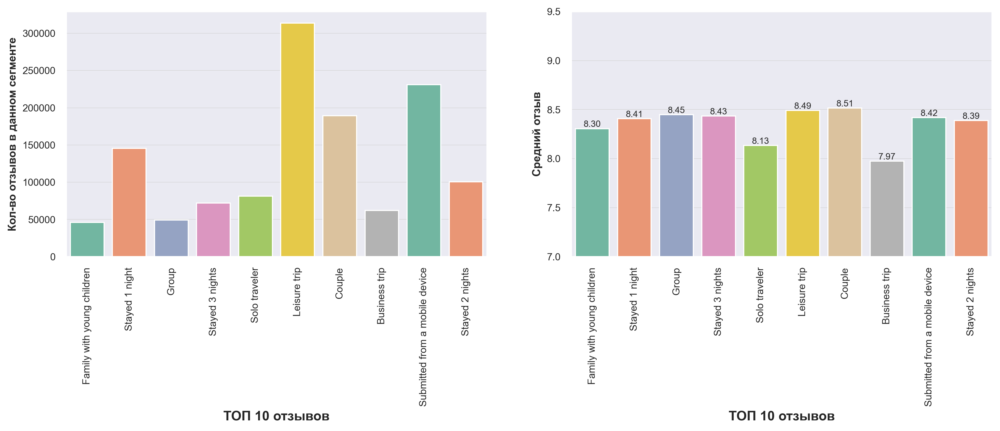

In [48]:
# Визуализируем ТОП 10 тагов
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 4), linewidth = .4)
sns.barplot(x=top_tags_info_df.index, y=top_tags_info_df[('count')], ax=ax1);
ax1.set_ylabel('Кол-во отзывов в данном сегменте', fontweight ='bold', fontsize = 10)
ax1.tick_params(axis='x', rotation=90)

bar_rooms = sns.barplot(x=top_tags_info_df.index, y=top_tags_info_df[('mean')], ax=ax2);
ax2.set_ylabel('Средний отзыв', fontweight ='bold', fontsize = 10)
ax2.tick_params(axis='x', rotation=90)
plt.ylim(7, 9.5);

for p in bar_rooms.patches:
    bar_rooms.annotate(
    '{:.2f}'.format(p.get_height()), (p.get_x()+0.4, p.get_height()),
    ha='center', va='bottom', fontsize=8)

ax1.set_xlabel('ТОП 10 отзывов', fontweight = 600, fontsize = 12);
ax2.set_xlabel('ТОП 10 отзывов', fontweight = 600, fontsize = 12);

ax1.tick_params(axis='both', which='major', labelsize=9)
ax2.tick_params(axis='both', which='major', labelsize=9)
    
plt.show()

<span style="color:lightblue">
Теперь думаю хватит играться с тагами. Это не самые четкие "ярко выраженные" параметры для модели, но как минимум для подтюнинга они имеют большой смысл.
</span>

<a id = '2.4'></a>

<p style = "background-color : DodgerBlue; border-radius: 5px 5px; padding : 10px"><strong>

## 2.4 Информация о рецензенте

</strong></p> 

In [49]:
# Посмотрим на общую картину по признаку
data.reviewer_nationality.value_counts()

 United Kingdom               245246
 United States of America      35437
 Australia                     21686
 Ireland                       14827
 United Arab Emirates          10235
                               ...  
 Guinea                            1
 Tuvalu                            1
 Comoros                           1
 Anguilla                          1
 Cape Verde                        1
Name: reviewer_nationality, Length: 227, dtype: int64

<span style="color:lightblue">
Очень большой разброс, есть страны с 1 отзывом,и это на 500к записей, и есть Великобритания, на которую на одну приходится около 60% всех отзывов.

В целях практики, я решил почистить все же эти данные. И тут я поступил следующим образом.

Страны в ТОП 122 я оставил как есть, а остальные обьединил по регионам. Чтобы осталась принадлежность к определенной части ареала обитания. Возможно от уровня специфики страны, региона, может варьироваться оценка постояльцем.


</span>

In [50]:
# Null записей нету, но проверим на всякий случай, нет ли пустых записей
cnt_no_nationality = data[data.reviewer_nationality.str.strip() == ''].shape[0]
print(Fore.LIGHTCYAN_EX + "\nКоличество записей без указанной национальности reviewer-а:",cnt_no_nationality)



Количество записей без указанной национальности reviewer-а: 523


In [51]:
# заполним модой
mode_country_reviewer = data.reviewer_nationality.mode().item()
data.loc[data[data.reviewer_nationality.str.strip() == ''].index,'reviewer_nationality'] = mode_country_reviewer

In [52]:
# Наш топ 122. Почему 122, просто решил что примерно 50 отзывов, это минимальное, что 
# может нести в себе более менее усредненную информацию
countries_top = data['reviewer_nationality'].value_counts().nlargest(122)
countries_top.index = countries_top.index.map(str.strip)
countries_top

United Kingdom              245769
United States of America     35437
Australia                    21686
Ireland                      14827
United Arab Emirates         10235
                             ...  
Zimbabwe                        51
Sudan                           51
Maldives                        49
Uganda                          47
Botswana                        42
Name: reviewer_nationality, Length: 122, dtype: int64

In [53]:
# Отдельно выделяем страны не вошедшие в топ 122
countries_bottom = data['reviewer_nationality'].value_counts().nsmallest(data['reviewer_nationality'].\
  value_counts().shape[0] - 121).\
  to_frame().rename(columns = {'reviewer_nationality': 'sub_region'})
countries_bottom.index = countries_bottom.index.map(str.strip)

# Отдельно я скачал с kaggle файл, сдержащий информацию по регионам
regions = pd.read_csv(EXTRA_DATA_DIR_OTHER + 'country_regions.csv')
regions = regions[["name", "sub-region"]].set_index('name').to_dict('dict')
regions

# обновляем информацию из загруженного датасета
countries_bottom['sub_region'] = countries_bottom.index.map(regions["sub-region"])

# 27 стран почему то не подтянули данные
# Дело оказалось в написании стран, и я это поправил вручную. Скучно было )
countries_bottom.isna().sum()

sub_region    27
dtype: int64

In [54]:
# Создаем словарь с соответствиями названий стран
countries_dict = {
  'Ivory Coast': 'Western Africa',
  'Svalbard Jan Mayen':'Northern Europe',
  'Vatican City':'Southern Europe',
  'Cape Verde':'Western Africa',
  'Cocos K I':'Australia and New Zealand',
  'St Pierre and Miquelon':'Northern America',
  'Cura ao':'Latin America and the Caribbean',
  'Syria':'Western Asia',
  'Bolivia':'Latin America and the Caribbean',
  'British Virgin Islands':'Latin America and the Caribbean',
  'U S Virgin Islands':'Latin America and the Caribbean',
  'Antigua Barbuda':'Latin America and the Caribbean',
  'Turks Caicos Islands':'Latin America and the Caribbean',
  'St Maarten':'Latin America and the Caribbean',  
  'Antarctica':'Antarctica',
  'Saint Barts':'Latin America and the Caribbean',
  'Saint Vincent Grenadines':'Latin America and the Caribbean',
  'Bonaire St Eustatius and Saba':'Latin America and the Caribbean',  
  'Central Africa Republic':'Middle Africa',
  'East Timor':'South-eastern Asia',
  'Saint Martin':'Latin America and the Caribbean',   
  'Falkland Islands Malvinas':'Latin America and the Caribbean',  
  'Reunion':'Eastern Africa',
  'Crimea' : 'Russia',
  'Swaziland':'Southern Africa',
  'Democratic Republic of the Congo':'Middle Africa',
  'Laos':'South-eastern Asia',
  'Cayman Islands' : 'Latin America and the Caribbean',
  
}

In [55]:
# приводим к такой же структуре, как и countries_bottm
countries_top = countries_top.to_frame().rename(columns = {'reviewer_nationality': 'sub_region'})
# формируем признак sub_region
countries_top.sub_region = countries_top.index.map(lambda x : x.strip())
countries_bottom.loc[countries_bottom[countries_bottom.sub_region.isna()].index,'sub_region'] = countries_bottom.\
  loc[countries_bottom[countries_bottom.sub_region.isna()].index,'sub_region'].index.map(countries_dict)
# обьединяем в один датасет все страны
countries_list = pd.concat([countries_top, countries_bottom])

In [56]:
# ТОП страны сохранили названия своей страны
countries_list.head(3)

,sub_region
United Kingdom,United Kingdom
United States of America,United States of America
Australia,Australia


In [57]:
# Не ТОП, получили название региона
countries_list.tail(3)

,sub_region
Jamaica,Latin America and the Caribbean
Botswana,Sub-Saharan Africa
Cayman Islands,Latin America and the Caribbean


In [58]:
# формируем словарь для обновления признака reviewer_nationality в основном датасете
countries_list_dict = countries_list[['sub_region']].to_dict()
# обновляем, согласно полученному нехитрыми действиями выше, словарю
data.reviewer_nationality = data.reviewer_nationality.map(lambda x : x.strip())
# добавляем также новый признак регион
data['review_region'] = data.reviewer_nationality.map(countries_list_dict['sub_region'])
# Смотрим что у нас теперь в ТОП 20
data['review_region'].value_counts().nlargest(20)

United Kingdom              245769
United States of America     35437
Australia                    21686
Ireland                      14827
United Arab Emirates         10235
Saudi Arabia                  8951
Netherlands                   8772
Switzerland                   8678
Germany                       7941
Canada                        7894
France                        7296
Israel                        6610
Italy                         6114
Belgium                       6031
Turkey                        5444
Kuwait                        4920
Spain                         4737
Romania                       4552
Russia                        3906
South Africa                  3821
Name: review_region, dtype: int64

In [59]:
# тут собрал основные данные по религии, немногоо добавил ручным поиском
# religion = pd.read_html('https://www.everycountryintheworld.com/religions/')

# languages = pd.read_html('https://www.everycountryintheworld.com/languages/')

In [60]:
# Загрузим данные по религии и основным языкам в регионе, которые я собрал и сохранил в файл
countries_list = pd.read_csv(EXTRA_DATA_DIR +'countries_collected_info.csv', index_col=0)

# Итак, внутри мы имеем 2 признака, основные языки и верисповедение. Я позволил себе вольность и индийские и будийские веры обьединил в одну.
countries_list.head(5)

,religion,languages
United Kingdom,Christianity,English
United States of America,Christianity,None (English has de facto status but not de jure status)
Australia,Christianity,None (English has de facto status)
Ireland,Christianity,"English, Irish"
United Arab Emirates,Islam,Arabic


In [61]:
# сформируем список из представленных стран в датасете и выставим основной язык в этой стране

hotels_countries = data.country.value_counts().to_frame()
hotels_countries['language'] = hotels_countries.index.map(countries_list.languages.to_dict())
hotels_countries.drop(columns=['country'], inplace = True)
hotels_countries_dict = hotels_countries.to_dict()['language']
# глянем на результат
hotels_countries


,language
United Kingdom,English
Spain,Spanish
France,French
Netherlands,Dutch
Austria,German
Italy,Italian


In [62]:
# приведем датафрейм к словарю
religion_dict = countries_list.to_dict()['religion']
# создадим новые признаки , основная религия страны рецензента, основные используемые языки в стране рецензента, 
# и основной язык в стране нахождения отеля
data['religion'] = data.reviewer_nationality.map(religion_dict)
data['reviewer_languages'] = data.reviewer_nationality.map(countries_list.languages.to_dict())
data['hotel_country_language'] = data.country.map(hotels_countries.to_dict()['language'])
# а тут создаим признак, который показывает, понимает ли рецензент на языке, который является основным в стране отеля расположения
data['mother_language'] = data.progress_apply(lambda x: 1 if x.hotel_country_language in x.reviewer_languages else 0, axis = 1)


100%|██████████| 515738/515738 [00:11<00:00, 43528.43it/s]


In [63]:
# посмотрим, что мы намутили в основном датасете
data.iloc[:5,37:]

,Stayed 2 nights,Submitted from a mobile device,Business trip,Couple,Leisure trip,Solo traveler,Stayed 3 nights,Group,Stayed 1 night,Family with young children,review_region,religion,reviewer_languages,hotel_country_language,mother_language
0,1,1,0,1,1,0,0,0,0,0,United Kingdom,Christianity,English,English,1
1,0,0,1,1,0,0,0,0,1,0,United Kingdom,Christianity,English,English,1
2,0,1,0,0,1,1,1,0,0,0,China,Buddhism,Mandarin Chinese,French,0
3,0,0,0,0,1,1,0,0,1,0,United Kingdom,Christianity,English,French,0
4,0,0,1,1,0,0,0,0,0,0,Poland,Christianity,Polish,Dutch,0


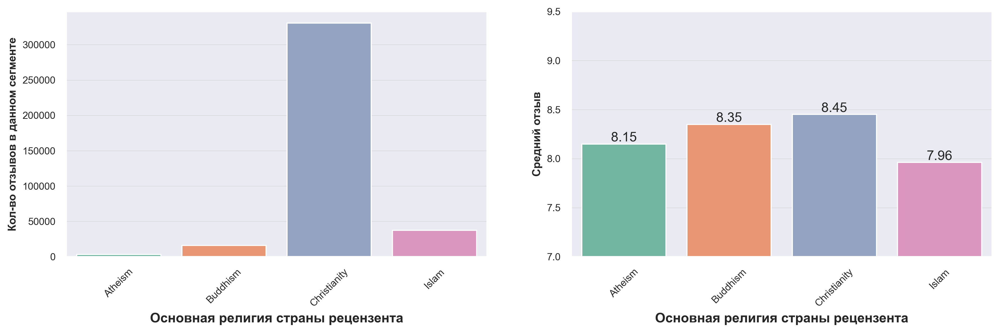

In [64]:
# Построим график по религии
reviewer_religion = pd.pivot_table(
    data=data[data['sample']==1],
    index='religion', 
    values='reviewer_score', 
    aggfunc=['count', 'mean'])


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 4), linewidth = .4)
sns.barplot(x=reviewer_religion.index, y=reviewer_religion[('count', 'reviewer_score')], ax=ax1);
ax1.set_ylabel('Кол-во отзывов в данном сегменте', fontweight ='bold', fontsize = 10)
ax1.tick_params(axis='x', rotation=45)

bar_rooms = sns.barplot(x=reviewer_religion.index, y=reviewer_religion[('mean', 'reviewer_score')], ax=ax2);
ax2.set_ylabel('Средний отзыв', fontweight ='bold', fontsize = 10)
ax2.tick_params(axis='x', rotation=45)
plt.ylim(7, 9.5);

for p in bar_rooms.patches:
    bar_rooms.annotate(
    '{:.2f}'.format(p.get_height()), (p.get_x()+0.4, p.get_height()),
    ha='center', va='bottom', fontsize=12)

ax1.set_xlabel('Основная религия страны рецензента', fontweight = 600, fontsize = 12);
ax2.set_xlabel('Основная религия страны рецензента', fontweight = 600, fontsize = 12);

ax1.tick_params(axis='both', which='major', labelsize=9)
ax2.tick_params(axis='both', which='major', labelsize=9)
    
plt.show()

<span style="color:lightblue">
Ситуация похожая на распределение значений в признаке класс номера. Почти все отзывы в сегменте Христианства. Будем надеятся, что следующие категории Ислам и Будизм, имеют все же какое то кол-во рецензентов и возможно этот признак будет хоть немного, но положительно влиять на модель
</span>

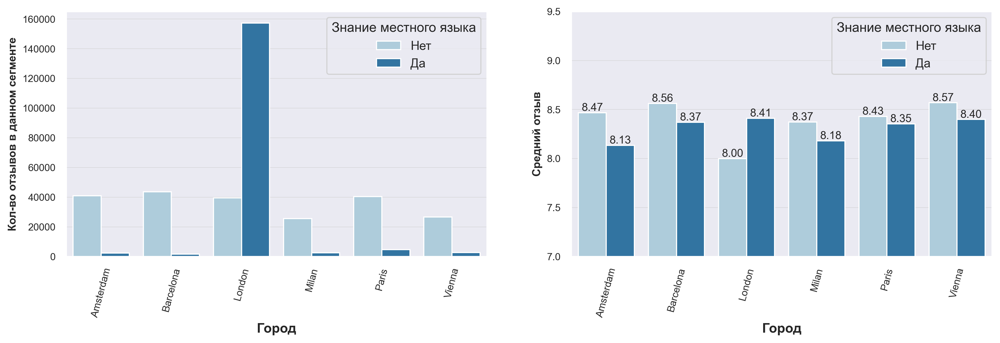

In [65]:
# Построим график по знанию локального языка по местонахождению отеля
reviewer_mother_language = pd.pivot_table(
    data=data[data['sample']==1],
    index=['city','mother_language'], 
    values='reviewer_score', 
    aggfunc=['count', 'mean']).reset_index('mother_language')

reviewer_mother_language.mother_language = reviewer_mother_language.mother_language.apply(lambda x: 'Нет' if x == 0 else 'Да')

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 4), linewidth = .4)

pal2 = sns.color_palette("Paired", 2)
sns.set_palette(pal2)

sns.barplot(x=reviewer_mother_language.index, y=reviewer_mother_language[('count', 'reviewer_score')], hue = reviewer_mother_language.mother_language, ax=ax1);
ax1.set_ylabel('Кол-во отзывов в данном сегменте', fontweight ='bold', fontsize = 10)
ax1.tick_params(axis='x', rotation=75)

bar_rooms = sns.barplot(x=reviewer_mother_language.index, y=reviewer_mother_language[('mean', 'reviewer_score')], hue = reviewer_mother_language.mother_language,ax=ax2);
ax2.set_ylabel('Средний отзыв', fontweight ='bold', fontsize = 10)
ax2.tick_params(axis='x', rotation=75)
plt.ylim(7, 9.5);

for p in bar_rooms.patches:
    bar_rooms.annotate(
    '{:.2f}'.format(p.get_height()), (p.get_x()+0.2, p.get_height()),
    ha='center', va='bottom', fontsize=10)

ax1.set_xlabel('Город', fontweight = 600, fontsize = 12);
ax2.set_xlabel('Город', fontweight = 600, fontsize = 12);

ax1.legend(title = 'Знание местного языка')
ax2.legend(title = 'Знание местного языка')

ax1.tick_params(axis='both', which='major', labelsize=9)
ax2.tick_params(axis='both', which='major', labelsize=9)

<span style="color:lightblue">
Так как основное кол-во отзывов и отелей приходится на Лондон, то и соответственно и отзывов больше оттуда. Интересный момент, который кидается в глаза, Лондон отличается от всех своих собратьев по обоим графикам. Количество отзывов знающих местный язык, превалирует у Лондона, по сравнению с другими странами. А в разрезе средней оценки, только в Лондоне, знающие местный язык, среднюю оценку поставили выше, в остальных случаях, незнающие местный язык, выставили оценки ниже. Будем надеятся, что данный признак будет полезен в построении модели

И я пока не удовлетворен выделенными признаками, так как они получаются очень "узкими, точеными", не хватает так сказать промежуточной детализации.

И я решил добавить еще регион и под регион, чтобы попытаться сделать сегментацию данного признака точнее
</span>

In [66]:

# не все страны можно сопоставить по имени, из-за разного описания, и я решил добавить aplha-3 код 
# для четкой связки
alpha_3_df = pd.read_csv(EXTRA_DATA_DIR_OTHER + 'country_regions.csv')
alpha_3 = alpha_3_df[["name", "alpha-3"]].set_index('name').to_dict('dict')['alpha-3']
countries_alpha = data['reviewer_nationality'].value_counts().to_frame()
countries_alpha['alpha'] = countries_alpha.index.map(alpha_3)

countries_dict = countries_alpha['alpha'].to_dict()

countries = pd.DataFrame(data.reviewer_nationality.unique(), columns = ['country_name']).set_index('country_name')
countries['alpha'] = countries.index.map(countries_dict)

countries.loc['United Kingdom', 'alpha'] = 'GBR'
countries.loc['Russia', 'alpha'] = 'RUS'
countries.loc['Czech Republic', 'alpha'] = 'CZE'
countries.loc['Iran', 'alpha'] = 'IRN'
countries.loc['South Korea', 'alpha'] = 'KOR'
countries.loc['Taiwan', 'alpha'] = 'TWN'
countries.loc['Macedonia', 'alpha'] = 'MKD'
countries.loc['Vietnam', 'alpha'] = 'VNM'
countries.loc['Macau', 'alpha'] = 'MAC'
countries.loc['Moldova', 'alpha'] = 'MDA'
countries.loc['Brunei', 'alpha'] = 'BRN'
countries.loc['Venezuela', 'alpha'] = 'VEN'
countries.loc['Tanzania', 'alpha'] = 'TZA'
countries.loc['Palestinian Territory', 'alpha'] = 'PSE'
countries.loc['Kosovo', 'alpha'] = 'XKX'
countries.loc['Abkhazia Georgia', 'alpha'] = 'GEO'
countries.loc['Cura ao', 'alpha'] = 'CUW'
countries.loc['Syria', 'alpha'] = 'SYR'
countries.loc['Ivory Coast', 'alpha'] = 'CIV'
countries.loc['Bolivia', 'alpha'] = 'BOL'
countries.loc['U S Virgin Islands', 'alpha'] = 'VIR'
countries.loc['British Virgin Islands', 'alpha'] = 'VGB'
countries.loc['Turks Caicos Islands', 'alpha'] = 'TCA'
countries.loc['Antigua Barbuda', 'alpha'] = 'ATG'
countries.loc['St Maarten', 'alpha'] = 'SXM'
countries.loc['Laos', 'alpha'] = 'LAO'
countries.loc['Falkland Islands Malvinas', 'alpha'] = 'FLK'
countries.loc['Crimea', 'alpha'] = 'RUS'
countries.loc['St Pierre and Miquelon', 'alpha'] = 'SPM'
countries.loc['Cocos K I', 'alpha'] = 'CCK'
countries.loc['Swaziland', 'alpha'] = 'SWZ'
countries.loc['Saint Martin', 'alpha'] = 'MAF'
countries.loc['Saint Vincent Grenadines', 'alpha'] = 'VCT'
countries.loc['Reunion', 'alpha'] = 'REU'
countries.loc['Bonaire St Eustatius and Saba', 'alpha'] = 'BES'
countries.loc['Democratic Republic of the Congo', 'alpha'] = 'COD'
countries.loc['East Timor', 'alpha'] = 'TLS'
countries.loc['Svalbard Jan Mayen', 'alpha'] = 'SJM'
countries.loc['Saint Barts', 'alpha'] = 'BLM'
countries.loc['Central Africa Republic', 'alpha'] = 'CAF'
countries.loc['Vatican City', 'alpha'] = 'VAT'
countries.loc['Cape Verde', 'alpha'] = 'CPV'

data['alpha'] = data.reviewer_nationality.map(countries.alpha.to_dict())
countries_full = countries.merge(alpha_3_df, how = 'inner',\
  left_on='alpha', right_on=['alpha-3'])[['alpha','region','sub-region']]

# двух стран не хватает, добавлю вручную
countries_full = pd.concat([countries_full, pd.DataFrame({'alpha' : ['XKX'],'region':['Europe'],'sub-region':['Southern Europe']})],\
  ignore_index = True)
countries_full = pd.concat([countries_full, pd.DataFrame({'alpha' : ['ATA'],'region':['Antarctica'],'sub-region':['Antarctica']})],\
  ignore_index = True)

countries_dict = countries_full.set_index('alpha').to_dict()
# создаем 2 новых признака - регион и подрегион в основном датасете
data['reviewer_region'] = data.alpha.map(countries_dict['region'])
data['reviewer_sub_region'] = data.alpha.map(countries_dict['sub-region'])

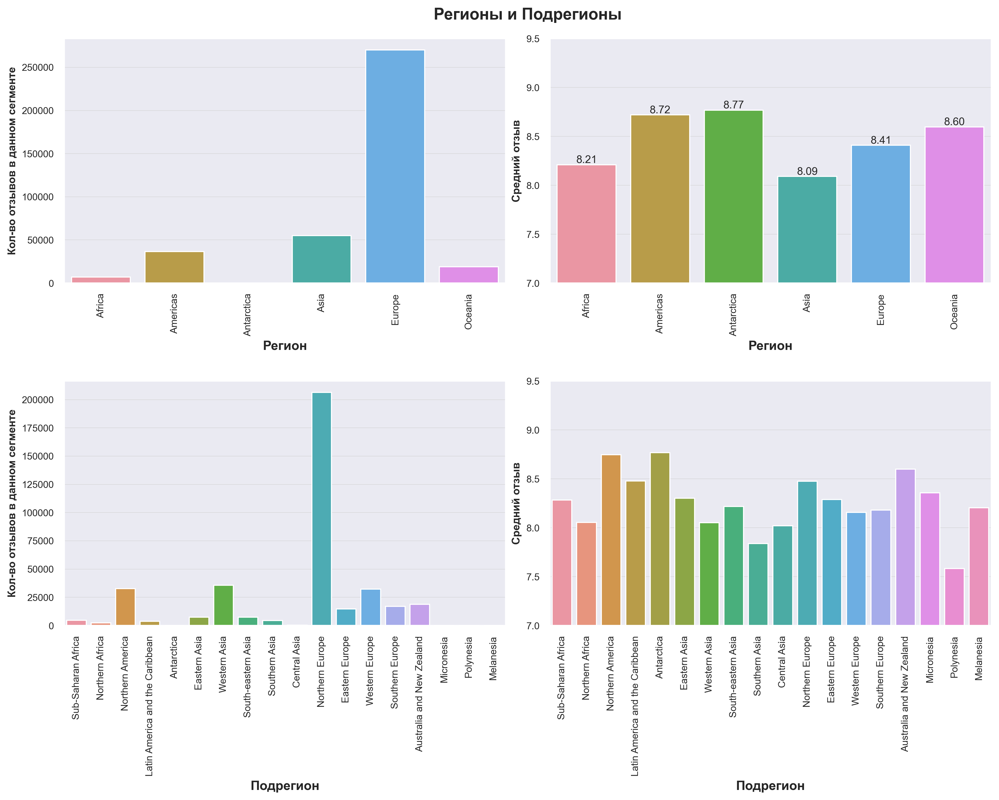

In [67]:
# Построим графики по региону и подрегиону
reviewer_region = pd.pivot_table(
    data=data[data['sample']==1],
    index=['reviewer_region'], 
    values='reviewer_score', 
    aggfunc=['count', 'mean'])

reviewer_sub_region = pd.pivot_table(
    data=data[data['sample']==1].sort_values(by = 'reviewer_region'),
    index=['reviewer_sub_region'], 
    values='reviewer_score', 
    aggfunc=['count', 'mean'],
    sort = False)

fig, (ax1,ax2) = plt.subplots(2, 2, figsize=(15, 4), linewidth = .4)

pal2 = sns.color_palette("Paired", 2)
sns.set_palette(pal2)

sns.barplot(x=reviewer_region.index, y=reviewer_region[('count', 'reviewer_score')],ax=ax1[0]);
ax1[0].set_ylabel('Кол-во отзывов в данном сегменте', fontweight ='bold', fontsize = 10)
ax1[0].tick_params(axis='x', rotation=90)

ax1[1].set_ylim(7, 9.5);
bars = sns.barplot(x=reviewer_region.index, y=reviewer_region[('mean', 'reviewer_score')], ax=ax1[1]);
ax1[1].set_ylabel('Средний отзыв', fontweight ='bold', fontsize = 10)
ax1[1].tick_params(axis='x', rotation=90)

for p in bars.patches:
    bars.annotate(
    '{:.2f}'.format(p.get_height()), (p.get_x()+0.4, p.get_height()),
    ha='center', va='bottom', fontsize=10)


plt.suptitle('Регионы и Подрегионы', 
             fontweight ='bold', size=15, y = 2.2)

sns.barplot(x=reviewer_sub_region.index, y=reviewer_sub_region[('count', 'reviewer_score')],ax=ax2[0]);
ax2[0].set_ylabel('Кол-во отзывов в данном сегменте', fontweight ='bold', fontsize = 10)
ax2[0].tick_params(axis='x', rotation=90)

ax2[1].set_ylim(7, 9.5);
sns.barplot(x=reviewer_sub_region.index, y=reviewer_sub_region[('mean', 'reviewer_score')], ax=ax2[1]);
ax2[1].set_ylabel('Средний отзыв', fontweight ='bold', fontsize = 10)
ax2[1].tick_params(axis='x', rotation=90)

plt.subplots_adjust(left=0.1,
                    bottom=0.2,
                    right=0.9,
                    top=2.1,
                    wspace=0.1,
                    hspace=.4)

ax1[0].set_xlabel('Регион', fontweight = 600, fontsize = 12);
ax1[1].set_xlabel('Регион', fontweight = 600, fontsize = 12);
ax2[0].set_xlabel('Подрегион', fontweight = 600, fontsize = 12);
ax2[1].set_xlabel('Подрегион', fontweight = 600, fontsize = 12);

ax1[0].tick_params(axis='both', which='major', labelsize=9)
ax1[1].tick_params(axis='both', which='major', labelsize=9)
ax2[0].tick_params(axis='both', which='major', labelsize=9)
ax2[1].tick_params(axis='both', which='major', labelsize=9)

<span style="color:lightblue">Переходим к обработке отзывов.</span>

<span style="color:lightblue">
На этом, я уже решил остановится с выделением признаков из признака <span style="color:pink">Страна рецензента</span>

<span style="color:lightblue">В итоге мы получили признаки:</span>

* Страна рецензента, мелкие страны обьединены в администартивные ареалы
* Выделили основную религию страны путешественника
* Выделили основной/-ые язык(и) путешественники, и создали признак, указывающий свободно ли посетитель общается локально или нет 
* Выделили основной регион (материк)
* Выделили подрегион



<a id = '2.5'></a>
<p style = "background-color : DodgerBlue; border-radius: 5px 5px; padding : 10px"><strong>

## 2.5 Обработка отзывов

</strong></p> 


<span style="color:lightblue">Переходим к обработке отзывов.</span>

Тут есть над чем призадуматься. Из интересного, это два признака
* negative_review
* positive_review,

которые могут содержать словесный отзыв об отеле.

<span style="color:lightblue">
Забегу вперед, после изучения текстов в данных полях, я нашел:</span>

* Не всегда используется английский
* В негативном отзыве может быть позитивный отзыв и наоборот для позитивного отзыва
* Также может быть просто пробел в обоих случаях
* Также в случае отсутствия негативного или позитивного отзыва, используется <span style="color:pink">No negative/No positive</span> соотвественно

<span style="color:lightblue">Тут я отфильтровал отзывы по коротким фразам (1-3 слова) и запустил <span style="color:red">проверку синтаксиса</span>. Дело долгое, с фразами толком не работает, в вообщем
так как часть автоматически все ж скоректировал, решил оставить, но подгружать из сохраненного файла. Ценности особой думаю в себе не несет данный поступок)
</span>

<span style="color:pink">
Пример
</span>

* Wfi -> Wi-Fi
* Nothung -> Nothing
* Nothinga -> Nothing
* Noyhing -> Nothing

In [68]:
repl_saved = pd.read_csv(EXTRA_DATA_DIR + 'replacements_v2.csv').set_index('index').to_dict('dict')
repl_index = set(repl_saved['translate'].keys())
repl_ind = data.loc[data['negative_review'].isin(repl_index)].index

# пропущенные заполним словами Neutral, так как далее я буду пытаться делать семантический разбор фраз
data.loc[data[data.negative_review == ' '].index,'negative_review'] = 'Neutral'
data.loc[data[data.positive_review == ' '].index,'positive_review'] = 'Neutral'
data.loc[repl_ind,'negative_review'] = data.loc[repl_ind,'negative_review'].map(repl_saved['translate'])


<span style="color:lightblue">Как я упоминал выше, мы имеем неунифицированные отзывы. И что нам советовали, если присутствовали на вэбинаре, применить семантический разбор фраз.

Тут я столкнулся с интересным моментом, негативные фразы, содержащие ограниченное кол-во слов, например :
* Location
* Kettle

Библиотекой не могут быть расценены, как негативные.

</span>

In [69]:
sia = SentimentIntensityAnalyzer()

def get_scores(review):
    """Функция принимает на вход отзыв и производит оценку семантики, что и возвращает в числовом виде
    для последующего анализа
    Args:
        review text (str): строка содержащая отзыв
    Returns:
        series 
    """ 
    sia_scores = sia.polarity_scores(review) # sentiment intensity analyzer
    return pd.Series({
        'review' : review,
        'negative' : sia_scores['neg'],
        'neutral'  : sia_scores['neu'],
        'positive' : sia_scores['pos'],
        'compound' : sia_scores['compound']
    })

In [70]:
# Уберем пробелы с обоих концов отзывов и приведем к одному правилу капитализации, чтобы обьединить одинаковые отзывы в разных. забыл слово...в вообщем чтобы
# все начиналось с большой буквы, а остаток фразы с маленькой
data.negative_review = data.negative_review.apply(lambda x : x.strip().capitalize())
data.positive_review = data.positive_review.apply(lambda x : x.strip().capitalize())

# создадим отдельный датасет с уникальными негативными отзывами с кол-вом слов менее 8 
review_symbols_neg_df = data[(data.negative_review.notna()) & (data.review_total_negative_word_counts < 8)].negative_review.value_counts().to_frame().rename(columns={'negative_review' : 'translate'})
review_symbols_neg_df.translate = np.nan

In [71]:
# Выберем часть негативных отзывов из датасета, которые имеют менее 8 слов
review_symbols_neg = data[(data.negative_review.notna()) & (data.review_total_negative_word_counts < 8)].negative_review
review_symbols_neg_df_tmp = review_symbols_neg.value_counts()[10:30].reset_index().\
  rename(columns={'index' : 'review'}).drop(columns='negative_review')
# Посмотрим, как негативные отзывы оценены системой
review_symbols_neg_df_sent = review_symbols_neg_df_tmp.review.progress_apply(get_scores)
display(review_symbols_neg_df_sent.style.background_gradient(\
        axis=None,  cmap='GnBu'))

100%|██████████| 20/20 [00:00<00:00, 2223.80it/s]


,review,negative,neutral,positive,compound
0,Location,0.000000,1.000000,0.000000,0.000000
1,Nothing at all,0.000000,1.000000,0.000000,0.000000
2,Everything,0.000000,1.000000,0.000000,0.000000
3,Nothing to dislike,0.000000,0.478000,0.522000,0.292400
4,Price,0.000000,1.000000,0.000000,0.000000
5,Nil,0.000000,1.000000,0.000000,0.000000
6,Small rooms,0.000000,1.000000,0.000000,0.000000
7,Everything was perfect,0.000000,0.351000,0.649000,0.571900
8,Na,0.000000,1.000000,0.000000,0.000000
9,Can t think of anything,0.000000,1.000000,0.000000,0.000000


<span style="color:lightblue">Как видите, из примера выше, негативный отзыв как:

* Everything, несет смысл что плохо все, а мы оцениваем его нейтрально
* также Price
* No, несет в себе смысл, что нету что упомянуть плохого, а оценка негативности дает -1, и общий (compound) становится отрицательным.

Как видите, чем длинее фраза, тем более корректный разбор семантики

Отсюда я решил написать немного regular expressions, которые в короткых отзывах вылавливают явно позитивные отзывы, и заменяют их на нейтральную фразу, которая будет воспринята коррекнее семантической библиотекой.

Также введу дополнительный признак, где я оценил, что отзыв отрицательный или положительный.
Принцип простой, все что попало под правила regular expression - то несло в себе положительный отзыв, остальное  - отрицательный.

</span>

In [72]:
# Собственно сам отлов позитивных, и местами явно негативных отзывов (есть негатвиные, которые опознаются как позитивные)
# отзывов, с последующей подменой 
repl_ind = review_symbols_neg_df[review_symbols_neg_df.index.str.contains('excel|positiv', regex=True, case=False)].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('(?!(?<=not.)|(?<=4.))(100|was perfect)', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('(?<!not.)(ama?zi)', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('\sfab', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('(?!(?<=not.)|(?<=wasn.t.)|(?<=not.very.))nice', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('(?<!too much.)(no comme|no recom|to ment)', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('Nothing to com|no bad co', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('(?!(?<=not a.)|(?<=phonique.)|(?<=is not.)|(?<=not.))perfect', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('cou.+t.+f.+nd', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('((will.)|(w[a|e][s|r].?n?(\s?)t.)|(i\w+(\s?)t.)|(not?(\s?))|(not?(\s?)(v[a|e]ry|so|a|that|really|too|such|the)\s))t?h?[a|e]?t?.?(good|great)', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 1
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('would.+(?<!not.)(recom|happi|retur|stay|defin)', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('(great|good).+but', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 1
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('lack', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 1
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('(?!(?<=nothing.)|(?<=wasnt the.)|(?<=not the.)|(?<=not always.))(great|good)(?!.be better)', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('nothing.(great|good)', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('not?\sthe\sbest', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 1
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('nothing.(except|well)', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 1
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('^N A|^Noth', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('^Notti|^nil|^nul', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('^none', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('^(\w){1,2}$', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('^nope.?|^nowt$|^zero$|(zero\s(disl|compl|faul|issu|noth|love|all w|no and))', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('I (?:(?!dont.)|(?:just.)|(?:do.))like.(?!.nothing)', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('dislike', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('like(.)+(ev|it a|al)', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('w?a?s?\s?liked (most|loc|break)', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('generally (i li|satis|ok)', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('absolutely loved|i love|loved? ever|(?<!hard.)lovely|love[s|d] (it|our|all|the who|this|the hotel)', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('(?<!expensive.)enjoyed|enjoyable', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('(?:(simply\s?|honest\s?|totally\s?|no\s?|in fact\s?|think\s?|guess\s?|mm\s?|Absurdity\s?|almost\s?|fault\s?|basic(.)+|as such\s?|A?o?s.l.te?ly\s?|about\s?|actually\s?|also\s?|Completely\s?|Disadvantages\s?|er\s?|em\s?|personally\s?|for us\s?|found\s?|franky\s?|just\s?|really\s?|honestly\s?))nothing(?!.around|.more)', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('(?:(particular\s?|literally\s?|well\s?|truly\s?|so far\s|that is\s?|was\s?|there is\s?|pretty much\s?|reall?y\s?|rien\s?|seriously\s?|nearly\s?|maybe\s?|honesty\s?|simply\s?|Practically\s?|overall\s?))nothing', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('(?<!location absolutely.)nothing (?:(around|special|important|to say|bad|against|too special))', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('(?:(at the moment\s?|frankly\s?|from our stay\s?|d say\s?|speechless\s?|my case\s?|change\s?|occasion\s?|One sentence\s?|Silly question\s?))nothing', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('(?<!prices.)(all a?r?e?\s?fine|^all g[i|o|u]|fantas|all excemp)', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('best(?!\s?was\s?unco)', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('was (?:(ok|fine|well|first cl|all rig|outst|very sat|really fin))', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('all ok|no issue|no negat|no fault', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('all\s.+accept|superb', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('honestly|rything was super', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('^not really anythi|^not really$|^not really at', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('no compla|happy|no proble|nada|(?<!not.)brill|(?:(was.|all.))cool|(?<!not.)as expect|wonder', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('couldn.?t\s? (be bet|faul|comp|reall|name|pick)', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('(?!(?<=only.)|(?<=ignoring a.))compla', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('(all|everything) (accept|cool|correct|in gene|is bett|is wel|excemp|in all|ok)', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('leave|faultles|all reasona|(^all|\sall)(.)+well', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('can\s?.?.?t (find|remem|tell|thin|real|say|compl|imagine bet|faul|report|stay he)', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('did\s?.?.?t (have one|use|find any|have anyt|find|notice an)', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('(doesn\'?t|don\s?t)\s(have (any|conc)|know|have$|think|remem|appl)', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('things?\s?(is|was|)\s?(ok|fine|well|just bril|grat|allr)', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('things?\s?(is|was|)\s?(o\s?k|fine|well|just bril|grat|allr|accep|awes|adeq|1st|10 p|beyo|compl|cool|deligh|exel|five|impecc|just (help|ok|sens)|perfe|w[o|u]nd|super|suita|specta|splend|t?o? (expec|satisf))', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('thing (went|we|was) (fine|right|top|very ple)', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('had to go|had to come|had to end', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('have non?e? (sugg|crit|obj)|have none|heading hom', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('to none|not much (at all|needs|rea|to chan)|hmm', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('(?!(?<=opening)|(?<=my stay)|(?<=should stayed)|(?<=should stay)) longer(?! break| stay| bed)', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('fault(?!y)|to say|no improvemen|no not|no partic|no probl|no probs|no quest|no real (issu|negat)|no rema|no regre|no specif|no suggest|no though|not mut?ch (x|to crit|to impro)|not sure$|noting|only stay|pretty (fancy|satis|much)|super locat|alles super|^very clean|vse|we were|zilch', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_neg_df[(review_symbols_neg_df.index.str.contains('no adv.+comments|(highly|ally) recomm', regex=True, case=False))].index
review_symbols_neg_df.loc[repl_ind,'translate'] = 0

In [73]:
# создаем словарь всех замен
review_symbols_neg_all_dict = review_symbols_neg_df.to_dict('dict')
# создаем словарь замен только нейтральных отзывов в негатвиных отзывах
review_symbols_neg_Zero_dict = review_symbols_neg_df[review_symbols_neg_df.translate == 0].to_dict('dict')
# создаем новый признак и отмечаем нейтральные отзывы
data['corr_negative_index'] = data.negative_review.map(review_symbols_neg_all_dict['translate'])
# все что не нейтральное, определяем как негативное
data.loc[data[data['corr_negative_index'].isna()].index,'corr_negative_index'] = 1

In [74]:
# Создаю новый признак, скооректированный негативный отзыв, где нейтральные отзывы заменяю словами Neutral
# Остальные оставляю по умолчанию, как были
data.loc[data[data.negative_review.isin(review_symbols_neg_Zero_dict['translate'])].index,'neg_review_corrected'] = \
  data[data.negative_review.isin(review_symbols_neg_Zero_dict['translate'])].negative_review.map(review_symbols_neg_Zero_dict['translate'])

data.loc[data[data['neg_review_corrected'].notna()].index,'neg_review_corrected'] = 'Neutral'
data.loc[data[data['neg_review_corrected'].isna()].index,'neg_review_corrected'] = data[data['neg_review_corrected'].isna()].negative_review.map(lambda x : x)

In [75]:
# аналогичная ситуация для позитивных отзывов
review_symbols_pos = data[(data.positive_review.notna()) & (data.review_total_positive_word_counts < 8)].positive_review
review_symbols_pos_df = review_symbols_pos.value_counts().index.to_frame().rename(columns={0 : 'translate'})
review_symbols_pos_df.translate = np.nan

repl_ind = review_symbols_pos_df[review_symbols_pos_df.index.str.contains('only.+stay', regex=True, case=False)].index
review_symbols_pos_df.loc[repl_ind,'translate'] = 1
repl_ind = review_symbols_pos_df[review_symbols_pos_df.index.str.contains('only', regex=True, case=False)].index
review_symbols_pos_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_pos_df[review_symbols_pos_df.index.str.contains('(was|is) no?t bad', regex=True, case=False)].index
review_symbols_pos_df.loc[repl_ind,'translate'] = 1
repl_ind = review_symbols_pos_df[review_symbols_pos_df.index.str.contains('(was|is) bad', regex=True, case=False)].index
review_symbols_pos_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_pos_df[review_symbols_pos_df.index.str.contains('^bad (exp|break|atti|show|and old|conn|not|cust|sta|pill)', regex=True, case=False)].index
review_symbols_pos_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_pos_df[review_symbols_pos_df.index.str.contains('(?<!Nothing to say) very bad', regex=True, case=False)].index
review_symbols_pos_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_pos_df[review_symbols_pos_df.index.str.contains('(?<!Nothing to say) very bad', regex=True, case=False)].index
review_symbols_pos_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_pos_df[review_symbols_pos_df.index.str.contains('bad exp|^bad$|really bad|very bad', regex=True, case=False)].index
review_symbols_pos_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_pos_df[review_symbols_pos_df.index.str.contains('noth', regex=True, case=False)].index
review_symbols_pos_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_pos_df[review_symbols_pos_df.index.str.contains('awful', regex=True, case=False)].index
review_symbols_pos_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_pos_df[review_symbols_pos_df.index.str.contains('don\s?t li', regex=True, case=False)].index
review_symbols_pos_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_pos_df[review_symbols_pos_df.index.str.contains('no pos', regex=True, case=False)].index
review_symbols_pos_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_pos_df[review_symbols_pos_df.index.str.contains('dirty|smelly|terrib|overpric|worst', regex=True, case=False)].index
review_symbols_pos_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_pos_df[review_symbols_pos_df.index.str.contains('crampe|noisy|uncom|rude|poor|horrib|ennorm|outdate|not? mu.h|not great|not includ|not clean|not a lot|none|no thi|no like|disli', regex=True, case=False)].index
review_symbols_pos_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_pos_df[review_symbols_pos_df.index.str.contains('no (elev|faci|info|heat|good|inter|like|no |need to re|rest|smok|tha|real)', regex=True, case=False)].index
review_symbols_pos_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_pos_df[review_symbols_pos_df.index.str.contains('no (reply|tv|use|non)', regex=True, case=False)].index
review_symbols_pos_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_pos_df[review_symbols_pos_df.index.str.contains('not (comin|as goo|cosy|enough|good)', regex=True, case=False)].index
review_symbols_pos_df.loc[repl_ind,'translate'] = 0
repl_ind = review_symbols_pos_df[review_symbols_pos_df.index.str.contains('zero|nil$|nul|nith', regex=True, case=False)].index
review_symbols_pos_df.loc[repl_ind,'translate'] = 0


In [76]:
review_symbols_pos_all_dict = review_symbols_pos_df.to_dict('dict')
review_symbols_pos_Zero_dict = review_symbols_pos_df[review_symbols_pos_df.translate == 0].to_dict('dict')
data['corr_positive_index'] = data.positive_review.map(review_symbols_pos_all_dict['translate'])
data.loc[data[data['corr_positive_index'].isna()].index,'corr_positive_index'] = 1

data.loc[data[data.positive_review.isin(review_symbols_pos_all_dict['translate'])].index,'pos_review_corrected'] = \
  data[data.positive_review.isin(review_symbols_pos_all_dict['translate'])].positive_review.map(review_symbols_pos_all_dict['translate'])
  
data.loc[data[(data['pos_review_corrected'].notna()) & (data.corr_positive_index == 0)].index,'pos_review_corrected'] = 'Negative'
data.loc[data[(data['pos_review_corrected'].notna()) & (data.corr_positive_index == 1)].index,'pos_review_corrected'] = 'Positive'
data.loc[data[data['pos_review_corrected'].isna()].index,'pos_review_corrected'] = data[data['pos_review_corrected'].isna()].positive_review.map(lambda x : x)

In [77]:
data.neg_review_corrected.replace({'Nothing': 'Neutral','N a' : 'Neutral', 'None' : 'Neutral', 'Nil' : 'Neutral', 'Na' : 'Neutral', 'No' : 'Neutral',\
  'Nothing at all' : 'Neutral', 'Nothing really' : 'Neutral', 'Nothing not to like' : 'Neutral', 'Non' : 'Neutral', 'Not applicable' : 'Neutral', 'Nothing in particular' : 'Neutral',\
  'There was nothing i didn t like' : 'Neutral', 'Nothing comes to mind' : 'Neutral', 'Not a thing':'Neutral',
  'No thing' : 'Neutral','No bad experience' : 'Neutral','No bad experiences' : 'Neutral',
  }, inplace = True)
data.pos_review_corrected.replace({'No positive': 'Neutral'}, inplace = True)

# Скорректируем указатель на явно не негативный отзыв, после последних коррекций
data.loc[data[data['neg_review_corrected'] == 'Neutral'].index,'corr_negative_index'] = 0

<span style="color:lightblue">Тут начинается самая "химия". Забегу вперед, лично все исследования на данном датасете, что я провел, я заметил, что наиболее точная модель основана именно на вычислении полярности отзывов. Что говорит, что люди имеют общую тенденцую при оценивания качества услуги, которая выражается в длине отзывов, метрик положительного и отрицательного описания и т.д.

Вот тут ниже я буду применять разные методы, с попыткой вычислить разные метрики на основании семантического разбора фраз. Главный момент, все используемые в данной работе библиотеки, и вообще доступные библиотеки, не являются панацеей и не могут точно выявлять положительный отзыв или нет во всех случаях. Отсюда, я использовал 3 разных библиотеки, для получения так сказать усредненной оценки полярности отзыва.
</span>

In [78]:

# создаем два экземпляра анализатора, чтобы разделить лексикон 
# для разной системы оценки положительных и отрицательных отзывов:
sia_neg = SentimentIntensityAnalyzer()
sia_pos = SentimentIntensityAnalyzer()

data['neg_scores'] = data['neg_review_corrected'].progress_apply(lambda x: sia_neg.polarity_scores(x))
data['pos_scores'] = data['pos_review_corrected'].progress_apply(lambda x: sia_pos.polarity_scores(x))

# формируем новые признаки:
data['n_review_sentiments_neg'] = data['neg_scores'].apply(lambda x: x['neg'])
data['n_review_sentiments_neu'] = data['neg_scores'].apply(lambda x: x['neu'])
data['n_review_sentiments_pos'] = data['neg_scores'].apply(lambda x: x['pos'])
data['n_review_sentiments_compound'] = data['neg_scores'].apply(lambda x: x['compound'])

data['p_review_sentiments_neg'] = data['pos_scores'].apply(lambda x: x['neg'])
data['p_review_sentiments_neu'] = data['pos_scores'].apply(lambda x: x['neu'])
data['p_review_sentiments_pos'] = data['pos_scores'].apply(lambda x: x['pos'])
data['p_review_sentiments_compound'] = data['pos_scores'].apply(lambda x: x['compound'])

100%|██████████| 515738/515738 [01:51<00:00, 4633.40it/s]


<span style="color:lightblue">Тут я решил провести эксперимент и рассчитать семантику и по не модифицированным мною review также.
</span>

In [79]:
# для разной системы оценки положительных и отрицательных отзывов:
sia_neg = SentimentIntensityAnalyzer()
sia_pos = SentimentIntensityAnalyzer()

data['neg_scores_in'] = data['negative_review'].progress_apply(lambda x: sia_neg.polarity_scores(x))
data['pos_scores_in'] = data['positive_review'].progress_apply(lambda x: sia_pos.polarity_scores(x))

# формируем новые признаки:
data['n_review_sentiments_neg_in'] = data['neg_scores_in'].apply(lambda x: x['neg'])
data['n_review_sentiments_neu_in'] = data['neg_scores_in'].apply(lambda x: x['neu'])
data['n_review_sentiments_pos_in'] = data['neg_scores_in'].apply(lambda x: x['pos'])
data['n_review_sentiments_compound_in'] = data['neg_scores_in'].apply(lambda x: x['compound'])

data['p_review_sentiments_neg_in'] = data['pos_scores_in'].apply(lambda x: x['neg'])
data['p_review_sentiments_neu_in'] = data['pos_scores_in'].apply(lambda x: x['neu'])
data['p_review_sentiments_pos_in'] = data['pos_scores_in'].apply(lambda x: x['pos'])
data['p_review_sentiments_compound_in'] = data['pos_scores_in'].apply(lambda x: x['compound'])

100%|██████████| 515738/515738 [01:51<00:00, 4614.80it/s]


<span style="color:lightblue">Еще один из популярных библиотек оценки семантики Afinn. Работает по принципу высчитывания среднего бала эмоциальности по каждому слову из оцениваемой строки. Какие-то слова оцениваются как сильно негативные, какие-то имеют меньший вес, какие-то нейтрально и т.д. В итоге имеем средний вес эмоции. Как и все библиотеки с подобными подходами имеет свой порядок точности, но для общей ситуации думаю очень неплохой вариант дополнительного анализа.
</span> 

In [80]:
afinn = Afinn()

In [81]:
# небольшой пример. Где то я удовлеторен результом, где-то не очень

print(f"{Fore.LIGHTBLUE_EX}Критический отзыв:{Fore.LIGHTGREEN_EX}{afinn.score('Everything amazingly bad')}")
print(f"{Fore.LIGHTBLUE_EX}Плохой отзыв:{Fore.LIGHTGREEN_EX}{afinn.score('Everything bad')}")
print(f"{Fore.LIGHTBLUE_EX}Микс с использованием хорошего и плохого слова:{Fore.LIGHTGREEN_EX}{afinn.score('Everything good bad')}")
print(f"{Fore.LIGHTBLUE_EX}3 коротких позитивных фразы и 2 с негативным оттенком:{Fore.LIGHTGREEN_EX}{afinn.score('Everything good. Breakfast so tasty. Weather was nice. Staff awfull. Will not back ever')}")
print(f"{Fore.LIGHTBLUE_EX}3 коротких позитивных фразы:{Fore.LIGHTGREEN_EX}{afinn.score('Everything good. Breakfast so tasty. Weather was nice')}")


Критический отзыв:-3.0
Плохой отзыв:-3.0
Микс с использованием хорошего и плохого слова:0.0
3 коротких позитивных фразы и 2 с негативным оттенком:6.0
3 коротких позитивных фразы:6.0


<span style="color:lightblue">
Я решил рассчитать дополнительно и этот коэффициент, так как на одну библиотеку нельзя полагаться, ввиду их несостоятельности )
А так будем иметь данные с нескольких библиотек, и можем играться с ними, как по отдельности, так и комбинируя результаты для получения усредненных метрик
</span>

In [82]:
%%time

data['review'] = data['pos_review_corrected'] + ' ' + data['neg_review_corrected']

data['negative_review_t'] = data['negative_review'].apply(
    lambda x: x.replace('No Negative', ''))
data['positive_review_t'] = data['positive_review'].apply(
    lambda x: x.replace('No Positive', ''))

data['review_in'] = data['positive_review_t'] + ' ' + data['negative_review_t']

# получаем счет:

data['afinn_score'] = data['review'].progress_apply(lambda x: afinn.score(x))
data['afinn_score_in'] = data['review_in'].progress_apply(lambda x: afinn.score(x))



100%|██████████| 515738/515738 [11:03<00:00, 777.59it/s]

CPU times: total: 21min 58s
Wall time: 21min 57s


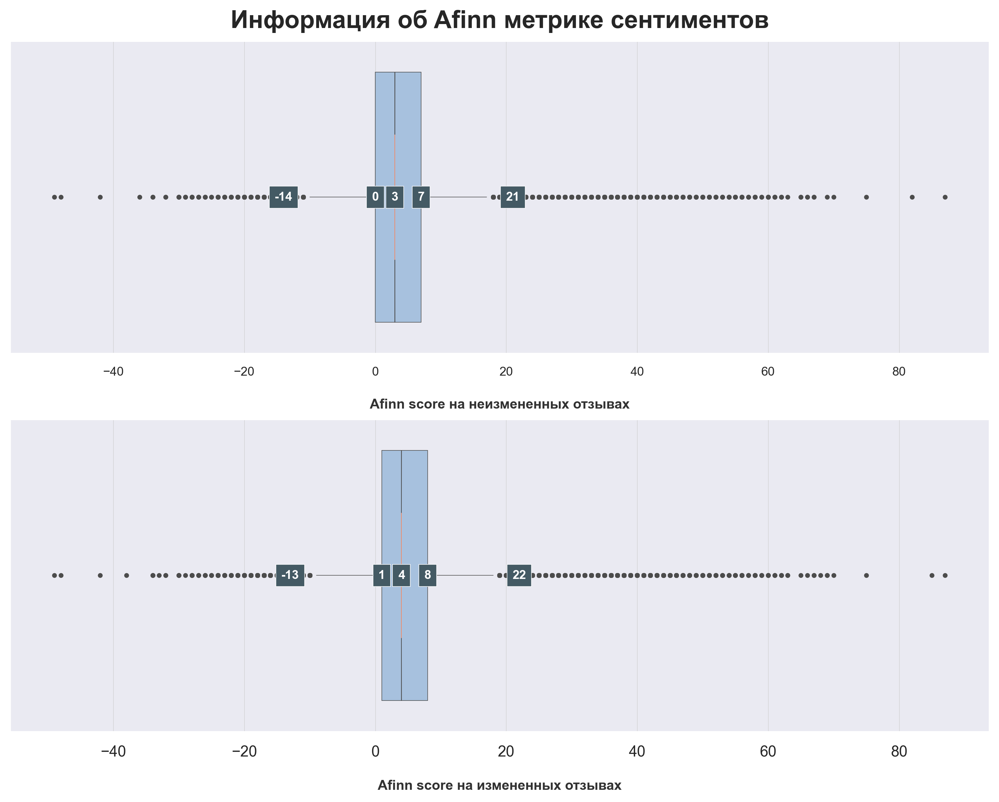

In [83]:
figure, (ax1, ax2) = plt.subplots(2, 1, figsize=(10,8), constrained_layout=True)

# Выставим тему и стиль для графиков
sns.set_theme(style="whitegrid", palette="pastel")

rc_style={'patch.edgecolor': 'w',
          'grid.color': '.8',
          'grid.linestyle': "-",
          }
sns.set(rc={"grid.linewidth":.3})
sns.set_style("darkgrid",rc_style)


sns.boxplot(
    data=data, x="afinn_score_in",
    notch=True, showcaps=False,
    flierprops={"marker": "."},
    boxprops={"facecolor": (.4, .6, .8, .5)},
    medianprops={"color": "coral"},
    linewidth=.4,
    ax = ax1
);

sns.boxplot(
    data=data, x="afinn_score",
    notch=True, showcaps=False,
    flierprops={"marker": "."},
    boxprops={"facecolor": (.4, .6, .8, .5)},
    medianprops={"color": "coral"},
    linewidth=.4,
    ax = ax2
);
# для пущей визуализации нанесем значения квантилей, медианы и нижнего заборчика
# на график, предварительно рассчитав их

q1 = data.afinn_score_in.quantile([.25]).item()
q3 = data.afinn_score_in.quantile([.75]).item()
iqr = q3 - q1
text_data = [
    data.afinn_score_in.median(),
    q1,
    q3,
    q1 - 2 * iqr,
    q3 + 2 *iqr
]

for t_data in text_data:
    ax1.text(
        # нанесем медианное значение на график
            t_data, 
            0, 
            f'{t_data:.0f}', 
            ha='center', 
            va='center', 
            fontweight='bold', 
            size=9,
            color='white',
            bbox=dict(facecolor='#445A64',linewidth = .4))
    

q1 = data.afinn_score.quantile([.25]).item()
q3 = data.afinn_score.quantile([.75]).item()
iqr = q3 - q1
text_data = [
    data.afinn_score.median(),
    q1,
    q3,
    q1 - 2 * iqr,
    q3 + 2 *iqr
]

for t_data in text_data:
    ax2.text(
        # нанесем медианное значение на график
            t_data, 
            0, 
            f'{t_data:.0f}', 
            ha='center', 
            va='center', 
            fontweight='bold', 
            size=9,
            color='white',
            bbox=dict(facecolor='#445A64',linewidth = .4))
    

#modify individual font size of elements
plt.suptitle('Информация об Afinn метрике сентиментов', size = 18, weight = 600)
ax2.set_xlabel('Afinn score на измененных отзывах', fontsize=10, labelpad = 15,
           fontdict = {'color' : '#323232', 'fontweight' : 600})
ax1.set_xlabel('Afinn score на неизмененных отзывах', fontsize=10, labelpad = 15,
           fontdict = {'color' : '#323232', 'fontweight' : 600})
ax1.tick_params(axis='both', which='major', labelsize=9)





<span style="color:lightblue">
Так как это синтезированная величина, то тут лучше избегать больших вылетов в оценках, учитывая, что данная метрика не является супер точной. Поэтому я тут решаю немного сузить разброс, остановившись на 2 квантилях в каждую сторону. Почему именно - 2, я игрался с данной величиной и лучшие результаты были именно около 2-ух. Хотя по графику вижу, что можно поиграться в диапазоне <span style="color:lightgreen">1.9 - 1.7</span>
</span>

In [84]:
# все что меньше или больше 2-х квантильного размаха, переопределяем граничными значениями
def get_outliers_bonds(data, feature):
    """Определяем границы диапазонов для ограничения значений"""
    x = data[feature]
    quartile_1, quartile_3 = x.quantile(0.25), x.quantile(0.75),
    iqr = quartile_3 - quartile_1
    lower = quartile_1 - (iqr * 2)
    upper = quartile_3 + (iqr * 2)
    return lower, upper


lower_bound, upper_bound = get_outliers_bonds(data, 'afinn_score')

data['afinn_score'] = data['afinn_score'].apply(
    lambda x: lower_bound if x < lower_bound else (upper_bound if x > upper_bound else x))

lower_bound, upper_bound = get_outliers_bonds(data, 'afinn_score_in')

data['afinn_score_in'] = data['afinn_score_in'].apply(
    lambda x: lower_bound if x < lower_bound else (upper_bound if x > upper_bound else x))

<span style="color:lightblue">
И еще пару метрик в общую топку, на основании измененных отзывов с использованием библиотеки <span style="color:green">textblob</span>

</span>

In [85]:
%%time

def get_polarity(text):
    """Получение параметра полярности отзыва"""
    blob = TextBlob(text)
    return blob.sentiment_assessments.polarity

data['positive_polarity'] = data['pos_review_corrected'].progress_apply(get_polarity)
data['negative_polarity'] = data['neg_review_corrected'].progress_apply(get_polarity)

100%|██████████| 515738/515738 [02:59<00:00, 2870.39it/s]

CPU times: total: 6min 5s
Wall time: 6min 4s


In [86]:
# Примеры работы получения полярности в диапазоне от -1 до 1 (плохо - хорошо)

print(f"{Fore.LIGHTBLUE_EX}Положительный отзыв:{Fore.LIGHTGREEN_EX}{get_polarity('Everything good'):.3f}")
print(f"{Fore.LIGHTBLUE_EX}Плохой отзыв:{Fore.LIGHTGREEN_EX}{get_polarity('Everything bad'):.3f}")
print(f"{Fore.LIGHTBLUE_EX}Микс с использованием хорошего и плохого слова:{Fore.LIGHTGREEN_EX}{get_polarity('Everything good bad amazing'):.3f}")
print(f"{Fore.LIGHTBLUE_EX}Положительная фраза:{Fore.LIGHTGREEN_EX}{get_polarity('Everything good amazing'):.3f}")



Положительный отзыв:0.700
Плохой отзыв:-0.700
Микс с использованием хорошего и плохого слова:0.200
Положительная фраза:0.650


In [87]:
%%time

tb = Blobber(analyzer=NaiveBayesAnalyzer())

# так как позитивный и негативный компонент - взаимнообратные величины, образующие в сумме 1 - 
# можно ограничится только одним:
def get_blobber_sentiment(text):
    """Получение коэффициента позитивной оценки"""
    blobber_sentiment = tb(text).sentiment
    return blobber_sentiment[1]

data['positive_review_pos'] = data['pos_review_corrected'].progress_apply(get_blobber_sentiment)
data['negative_review_pos'] = data['neg_review_corrected'].progress_apply(get_blobber_sentiment)

100%|██████████| 515738/515738 [02:16<00:00, 3788.71it/s]

CPU times: total: 4min 35s
Wall time: 4min 44s


In [88]:
# Примеры работы получения полярности в диапазоне от 0 до 1 положительной метрики в ощей оценке от 0 до 1 (плохо - хорошо)

print(f"{Fore.LIGHTGREEN_EX}Полный пример возвращения метрики:{Fore.LIGHTYELLOW_EX}\n{tb('Everything good').sentiment}\n")

# Мы возвращаем только положительную оценку!!!
print(f"{Fore.LIGHTBLUE_EX}Положительный отзыв:{Fore.LIGHTGREEN_EX}{get_blobber_sentiment('Everything good'):.3f}")
print(f"{Fore.LIGHTBLUE_EX}Плохой отзыв:{Fore.LIGHTGREEN_EX}{get_blobber_sentiment('Everything bad'):.3f}")
print(f"{Fore.LIGHTBLUE_EX}Микс с использованием хорошего и плохого слова:{Fore.LIGHTGREEN_EX}{get_blobber_sentiment('Everything good bad amazing'):.3f}")
print(f"{Fore.LIGHTBLUE_EX}Положительная фраза:{Fore.LIGHTGREEN_EX}{get_blobber_sentiment('Everything good amazing'):.3f}")



Полный пример возвращения метрики:
Sentiment(classification='pos', p_pos=0.5502073808243124, p_neg=0.4497926191756876)

Положительный отзыв:0.550
Плохой отзыв:0.378
Микс с использованием хорошего и плохого слова:0.509
Положительная фраза:0.673


<span style="color:lightblue">
У нас есть две схожие метрики, которые в диапазоне от -1 до 1 показывают оценку, это метрики полученные с помощью :

* SentimentIntensityAnalyzer
* TextBlob

Вот я еще решил получить среднюю по этим двум для негативных, позитивных и скомпонованных вместе оценок. Так сказать понизить ошибку определения.

</span>

In [89]:
# синтезируем по вышеописанному принципу 3 признака
data['com_pol_pos'] = round((data.positive_polarity + data.p_review_sentiments_compound_in) / 2, 2)
data['com_pol_neg'] = round((data.negative_polarity + data.n_review_sentiments_compound_in) / 2, 2)
data['com_pol'] = data['com_pol_pos'] + data['com_pol_neg']

<span style="color:lightblue">
Все. Колдовство с семантическим анализом закончено.
Насколько я заметил в момент исследования, как я уже говорил, то это метрики построенные именно на анализе семантики. Отсюда, нехватает одного метода получения данной метрики, так как будет наблюдаться сдвиг в какую-то сторону, из-за неточности алгоритмов.

Поэтому лучше использовать несколько алгоритмов и грубо говоря накладывать один на один, для получения более усредненного варианта от всех алгоритмов, для уменьшения ошибки анализа текста

</span>

In [90]:
# В итоге мы наколодовали следующие признаки
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 515738 entries, 0 to 515737
Data columns (total 92 columns):
 #   Column                                      Non-Null Count   Dtype         
---  ------                                      --------------   -----         
 0   hotel_address                               515738 non-null  object        
 1   additional_number_of_scoring                515738 non-null  int64         
 2   review_date                                 515738 non-null  datetime64[ns]
 3   average_score                               515738 non-null  float64       
 4   hotel_name                                  515738 non-null  object        
 5   reviewer_nationality                        515738 non-null  object        
 6   negative_review                             515738 non-null  object        
 7   review_total_negative_word_counts           515738 non-null  int64         
 8   total_number_of_reviews                     515738 non-null  int64        

<a id = '3'></a>

<p style = "background-color : DarkGreen; border-radius: 5px 5px; padding : 10px"><strong>

# 3 Отбор признаков

</strong></p> 

<span style="color:lightblue">
В данном разделе избавимся от ненужных признаков, которые не подходят для машинного обучения, такие как строки, даты. Мы это можем сделать без тяжести на сердце, так как мы высосали до этого из них много информации, которую предали цифровому виду. Например таги.
Также сделаем анализ на наличие мультиколинеарности.

Сразу забегу вперед. Не все, что высококолерировано, то обязательно плохо. Иногда, как я понял из исследований, если мы имеем оценочные признаки, которые прямо связаны с целевой величиной, то такие признаки в комбинации друг с другом могут выступать как "уточняющие" друг друга и в итоге балансировать модель, а не ухудшать ее
</span>

In [91]:
# создаем дубликат базы для дальнейших манипуляций со столбцами (для обратимости экспериментов):
data_copy = data.copy()

In [92]:
# посмотрим признаки, которые типов категория, дата, и строки
def getNonNumberTypeFeatures(df):
    """Функция возвращает в списке все признаки из датасета, что подходят под описанные правила

    Args:
        df (pandas.Dataframe()): Датасет

    Returns:
        list: Список признаков
    """
    object_columns = [s for s in data_copy.columns
                    if ((data_copy[s].dtypes == 'object') | \
                        (data_copy[s].dtype.name == 'category') | \
                        (data_copy[s].dtypes == 'datetime64[ns]') |
                        (data_copy[s].dtype.name == 'period[M]'))]
    return object_columns

types_list = getNonNumberTypeFeatures(data_copy)
print(Fore.LIGHTCYAN_EX + "\nКоличество признаков, которые надо удалить,\
 либо привести к машиноподходящему типу:",Fore.LIGHTGREEN_EX, types_list.__len__())
display(types_list)


Количество признаков, которые надо удалить, либо привести к машиноподходящему типу:  36


['hotel_address',
 'review_date',
 'hotel_name',
 'reviewer_nationality',
 'negative_review',
 'positive_review',
 'tags',
 'days_since_review',
 'lat',
 'lng',
 'city',
 'country',
 'post_index',
 'suburb',
 'neighborhood',
 'review_period',
 'trip_type',
 'travellers_type',
 'room_class',
 'review_region',
 'religion',
 'reviewer_languages',
 'hotel_country_language',
 'alpha',
 'reviewer_region',
 'reviewer_sub_region',
 'neg_review_corrected',
 'pos_review_corrected',
 'neg_scores',
 'pos_scores',
 'neg_scores_in',
 'pos_scores_in',
 'review',
 'negative_review_t',
 'positive_review_t',
 'review_in']

In [93]:
# Удалим признаки, которые не будет дальше использовать
drop_list = []

# тут мы удаляем соответственно не числовые признаки, даты 
# и не несущие никакой смысловой нагрузки - типа координаты
drop_list.append('hotel_name')
drop_list.append('review_date')
drop_list.append('negative_review')
drop_list.append('positive_review')
drop_list.append('temp_tag_count')
drop_list.append('tags')
drop_list.append('lat')
drop_list.append('lng')
drop_list.append('review_period')
drop_list.append('alpha')
drop_list.append('neg_review_corrected')
drop_list.append('pos_review_corrected')
drop_list.append('neg_scores')
drop_list.append('pos_scores')
drop_list.append('neg_scores_in')
drop_list.append('pos_scores_in')
drop_list.append('review')
drop_list.append('review_in')
drop_list.append('negative_review_t')
drop_list.append('positive_review_t')

data_copy.drop(drop_list, axis = 1, inplace=True)

# Перекодируем нужные нам признаки в категорийный тип с последующим порядковым кодированием, 
# (те что не удалили, а признали полезными).

for feature in getNonNumberTypeFeatures(data_copy):
  data_copy[feature] = data_copy[feature].astype('category')
  data_copy[feature] = data_copy[feature].cat.codes


In [94]:
# В итоге имеем следующий датасет
data_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 515738 entries, 0 to 515737
Data columns (total 72 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   hotel_address                               515738 non-null  int16  
 1   additional_number_of_scoring                515738 non-null  int64  
 2   average_score                               515738 non-null  float64
 3   reviewer_nationality                        515738 non-null  int16  
 4   review_total_negative_word_counts           515738 non-null  int64  
 5   total_number_of_reviews                     515738 non-null  int64  
 6   review_total_positive_word_counts           515738 non-null  int64  
 7   total_number_of_reviews_reviewer_has_given  515738 non-null  int64  
 8   reviewer_score                              515738 non-null  float64
 9   days_since_review                           515738 non-null  int16  
 

In [95]:
# Признаков много, признаки из разных областей, поэтому поделим их на смысловые и типовые группы
# непрерывные и категориальные признаки:
num_cols = [
    # признаки связанные с количеством слов:
    'review_total_negative_word_counts', 'review_total_positive_word_counts',
    
     # признаки, связанные с анализом эмоциональной окраски отзывов:
    'n_review_sentiments_neg', 'n_review_sentiments_neu',
    'n_review_sentiments_pos', 'n_review_sentiments_compound',
    'p_review_sentiments_neg', 'p_review_sentiments_neu',
    'p_review_sentiments_pos', 'p_review_sentiments_compound',
    
    'n_review_sentiments_neg_in', 'n_review_sentiments_neu_in',
    'n_review_sentiments_pos_in', 'n_review_sentiments_compound_in',
    'p_review_sentiments_neg_in', 'p_review_sentiments_neu_in',
    'p_review_sentiments_pos_in', 'p_review_sentiments_compound_in',
    
    'com_pol_pos', 'com_pol_neg', 'com_pol', 'positive_polarity', 'negative_polarity',
    'positive_review_pos', 'negative_review_pos', 'afinn_score', 'afinn_score_in',
    

    # остальные количественные:
    'total_number_of_reviews_reviewer_has_given', 'total_number_of_reviews',
    'distance_from_center'
]

cat_cols = [
    # характеристики отеля
    'average_score', 'additional_number_of_scoring', 'total_number_of_reviews',
    'hotel_address', 'city', 'country', 
    'post_index', 'suburb',
    'neighborhood', 'days_since_review',

    # характеристики поездки (номер):
    'trip_type', 'sumbit_type','travellers_type','with_pet_type','with_view',
    'without_window','room_class','count_nights','Couple','Stayed 2 nights', 
    'Leisure trip','Group','Solo traveler','Stayed 1 night','Business trip',
    'Submitted from a mobile device','Family with young children','Stayed 3 nights',

    # характеристики рецензента:
    'review_region','religion','reviewer_languages', 'reviewer_nationality',
    'hotel_country_language','mother_language','reviewer_region','reviewer_sub_region',

    # время поездки:
    'month', 'year', 'day',

    # характеристики отзыва:
    'corr_negative_index', 'corr_positive_index',
]

In [96]:
# Обернем построение кореляционной диаграммы в функцию
def show_corr_heatmap(columns_list, title, method):
    """Построения корреляционной диаграммы"""
    fig_, ax_ = plt.subplots(figsize=(15, 12))
    corr = data_copy[columns_list].corr(method=method).abs()
    mask = np.triu(np.ones_like(corr, dtype=bool))
    sns.heatmap(corr, 
                annot=True,
                annot_kws={"fontsize":9}, 
                linewidths=0.1, 
                ax=ax_, 
                mask=mask, 
                cmap='GnBu',
                fmt='.2f')
    ax_.set_title(title, fontsize=18)
    plt.show()

In [97]:
# Инициализируем список для добавления признаков, что решим удалить
drop_columns = []

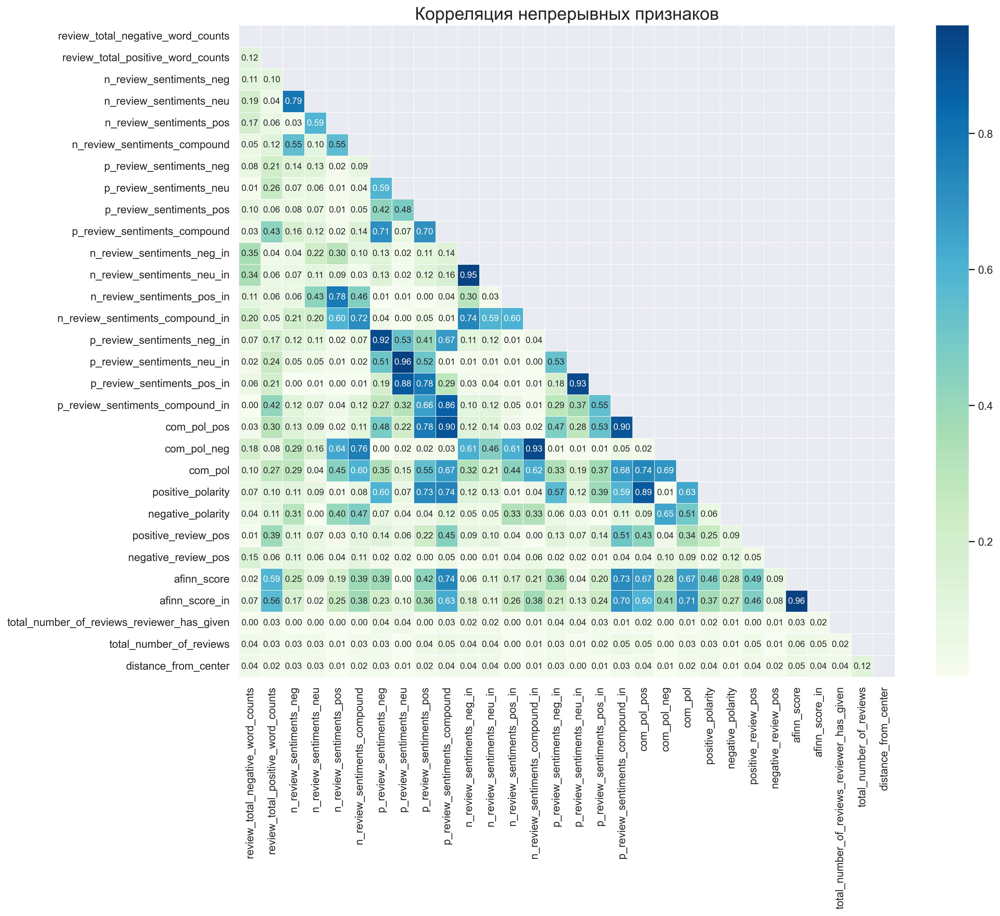

In [98]:
#строим диаграмму для непрерывных признаков:
show_corr_heatmap(num_cols, 'Корреляция непрерывных признаков', method='pearson');

In [99]:
# чтобы еще вывести в "копируемом" после формате, напишем следующие стоки кода

corr = data_copy[num_cols].corr(method='pearson')
print(Fore.LIGHTCYAN_EX, 'Наиболее высокая корреляция между признаками:')
corr_unstack = corr.abs().unstack().reset_index()

corr_unstack = corr_unstack.rename(columns = {'level_0' : 'feature 1', 'level_1' : 'feature 2',0 : 'Corr ind' }).\
     sort_values(by = 'Corr ind', ascending = False)
corr_unstack[((corr_unstack['feature 1'] != corr_unstack['feature 2']) & (corr_unstack['Corr ind'] > .7))].\
  iloc[0::2,:].reset_index(drop = True)


 Наиболее высокая корреляция между признаками:


,feature 1,feature 2,Corr ind
0,p_review_sentiments_neu,p_review_sentiments_neu_in,0.959
1,afinn_score,afinn_score_in,0.957
2,n_review_sentiments_neg_in,n_review_sentiments_neu_in,0.949
3,com_pol_neg,n_review_sentiments_compound_in,0.933
4,p_review_sentiments_neu_in,p_review_sentiments_pos_in,0.927
5,p_review_sentiments_neg,p_review_sentiments_neg_in,0.925
6,com_pol_pos,p_review_sentiments_compound,0.902
7,com_pol_pos,p_review_sentiments_compound_in,0.898
8,com_pol_pos,positive_polarity,0.886
9,p_review_sentiments_pos_in,p_review_sentiments_neu,0.881


<span style="color:lightblue">
Я уже упоминал выше, Да - тут у нас есть высококореллируемые признаки, но все они относятся к оценке сентиментов, и в данном случае они, я бы так назвал - корректирующие друг друга, и тут их важнее оставить, чем удалить. 

Еще раз, тут синтетически полученные оценки 3-мя разными библиотеками, основанные на разных алгоритмах. И использование только одной модели, даст нам перекос, а использование трех разных одновременно, подправит модель

</span>

In [100]:
# тут поделим на 2 раздела, относительно Типа поездки и другое
segment_1 = cat_cols[:10] + cat_cols[28:]
segment_2 = cat_cols[10:28]

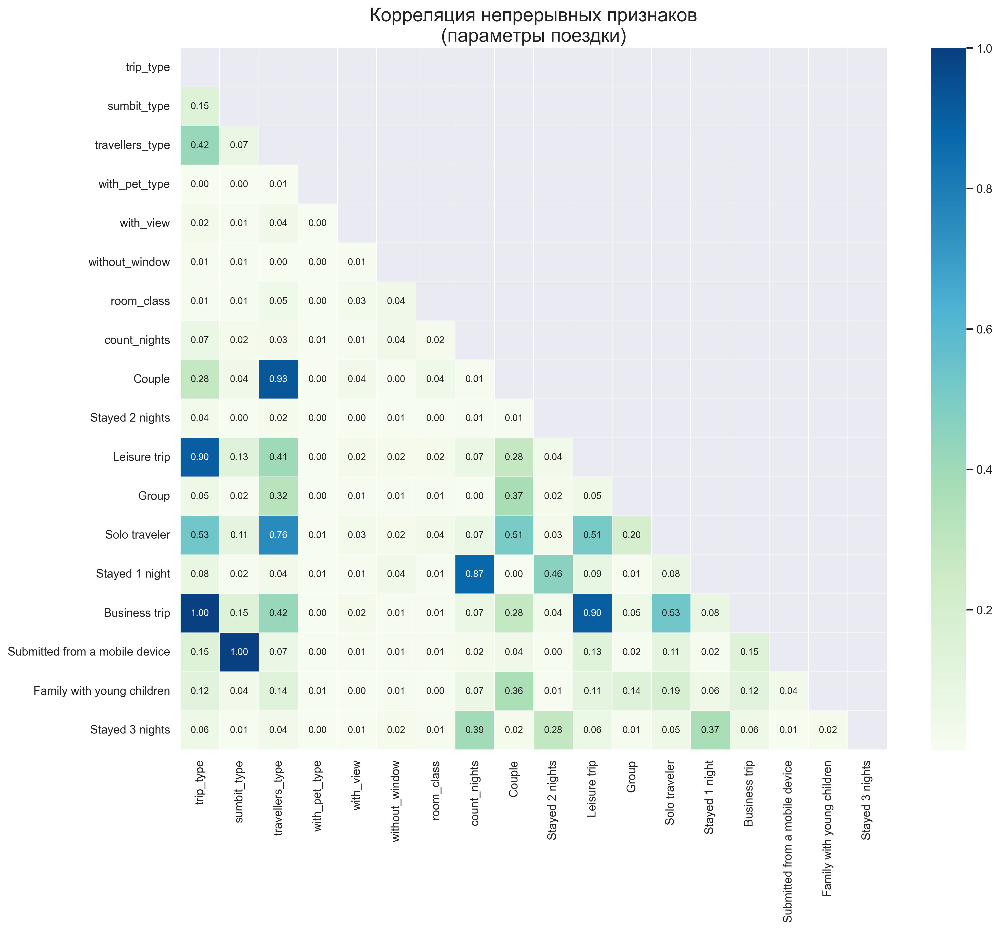

In [101]:
show_corr_heatmap(
    segment_2, 
    'Корреляция непрерывных признаков\n(параметры поездки)', 
    method='spearman'
);

In [102]:
drop_columns.append('Submitted from a mobile device')


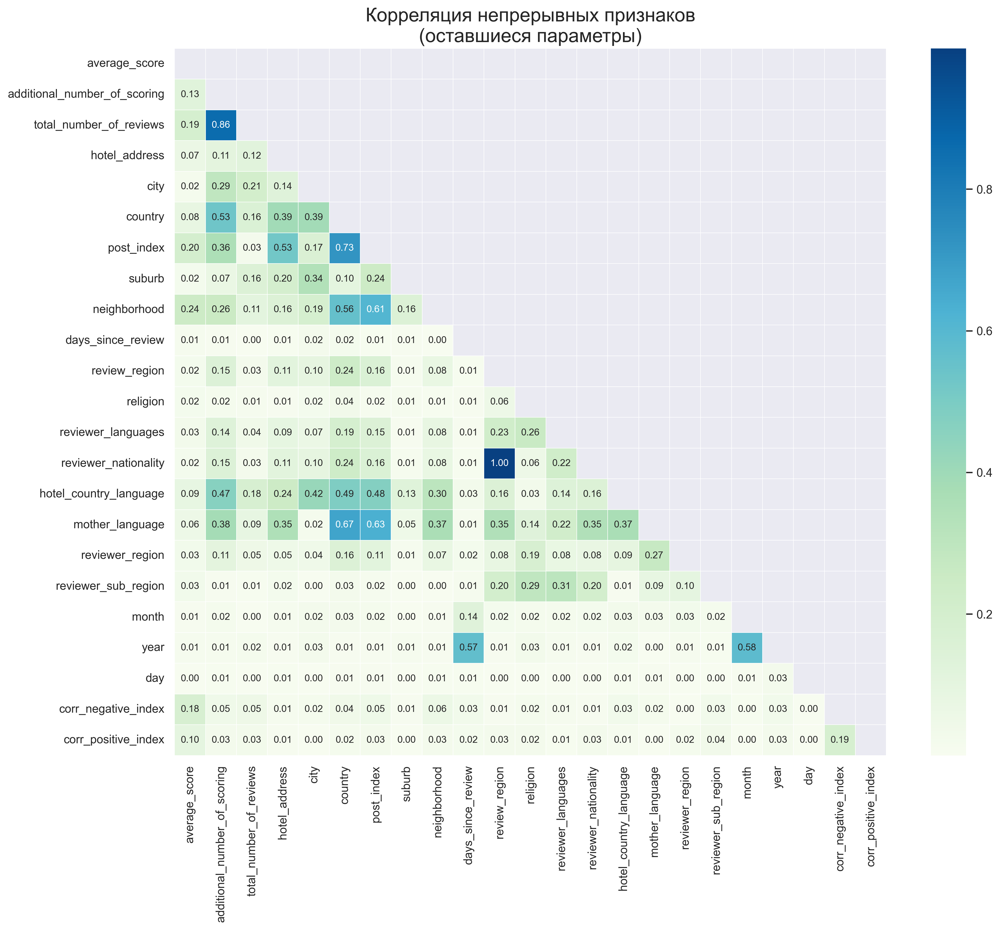

In [103]:
show_corr_heatmap(
    segment_1, 
    'Корреляция непрерывных признаков\n(оставшиеся параметры)',  
    method='spearman'
);

In [104]:
# данный признак высококореллируемый и на мой взгляд, должен быть удален
drop_columns.append('additional_number_of_scoring')
# видно задублировал этот признак, честно - лень проверять
drop_columns.append('reviewer_nationality')

#### Последний штрих
<span style="color:lightblue">
Проведем оценку значимости признаков. Воспользуемся для оценки дисперсионным анализом ANOVA:
</span>

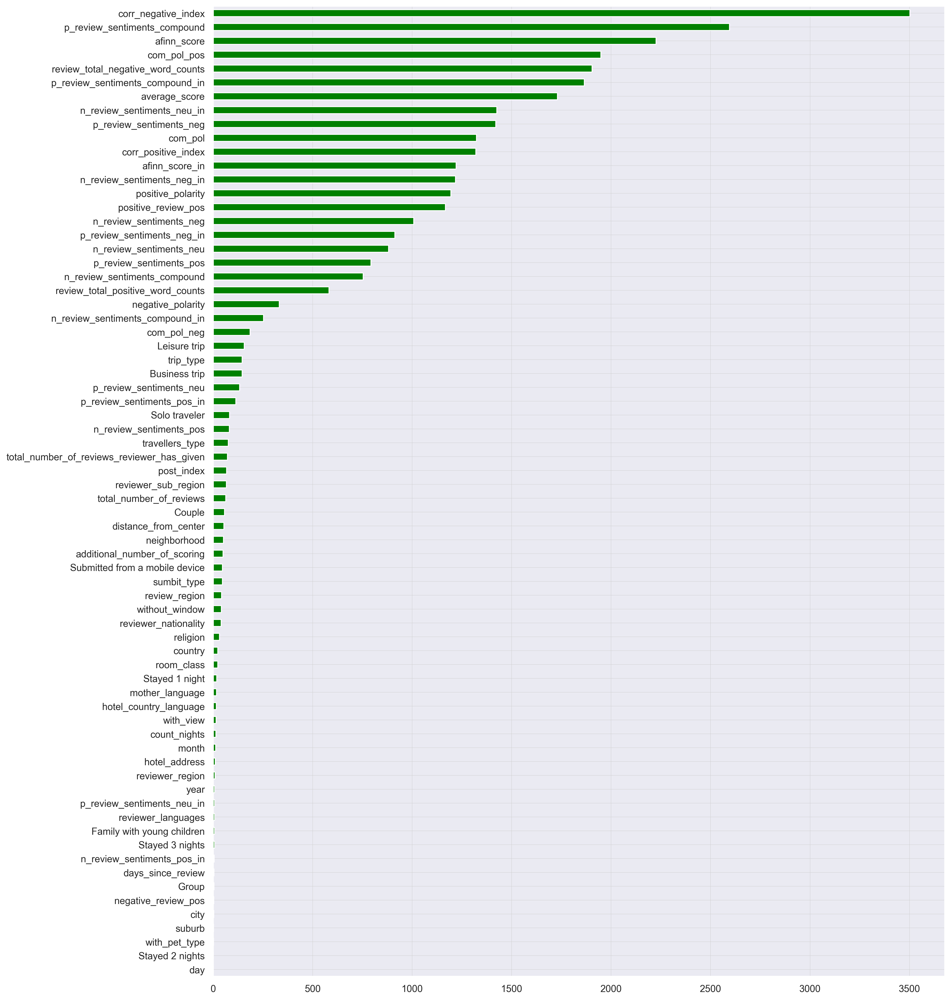

In [105]:
y = data_copy.query('sample == 1').drop(['sample'], axis=1).reviewer_score.values
X = data_copy.query('sample == 1').drop(['sample', 'reviewer_score'], axis=1)

# визуализируем результат анализа значимости:
imp_num = pd.Series(f_classif(X[X.columns], y)[0], index = X.columns)
imp_num.sort_values(inplace = True)

fig5, ax5 = plt.subplots(figsize=(15, 20))
imp_num.plot(kind = 'barh', color='green');

<span style="color:lightblue">
У нас есть несколько признаков в самой нижней части графика, которые почти не обладают "значимостью"

Можем их также удалить, в добавление к парочке других выбранных нами коррелируемых признаков
</span>

In [106]:
drop_columns.extend(['days_since_review', 'Group', 
                'city', 'suburb', 'with_pet_type','Stayed 2 nights', 'day','Stayed 3 nights',\
                'Family with young children','reviewer_languages'])

In [107]:
# удалим незначимые числовые данные:
print(f'Удалим еще {len(drop_columns)} столбцов с числовыми данными')
data_copy.drop(drop_columns, axis = 1, inplace=True)

print(f'Итоговое получившееся количество признаков: {len(data_copy.columns)}')
print('(включая столбец "Sample" и целевой столбец)')

Удалим еще 13 столбцов с числовыми данными
Итоговое получившееся количество признаков: 59
(включая столбец "Sample" и целевой столбец)


<a id = '4'></a>

<p style = "background-color : DarkGreen; border-radius: 5px 5px; padding : 10px"><strong>

# 4. Обучение моделей и получение предсказаний

</strong></p> 


In [108]:
# В самом начале я не удалял дубликаты, но они есть, удалим их
train_data = data_copy.query('sample == 1').drop(['sample'], axis=1).drop_duplicates()

test_data = data_copy.query('sample == 0').drop(['sample'], axis=1)

y = train_data.reviewer_score.values            # наш таргет
X = train_data.drop(['reviewer_score'], axis=1)

# воспользуемся специальной функцие train_test_split для разделения тестовых данных
# выделим 20% данных на валидацию (параметр test_size)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=RANDOM_STATE)

# проверяем размеры:
test_data.shape, train_data.shape, X.shape, X_train.shape, X_test.shape

((128935, 58), (386487, 58), (386487, 57), (309189, 57), (77298, 57))

<a id = '4.1'></a>
<p style = "background-color : DodgerBlue; border-radius: 5px 5px; padding : 10px"><strong>

## Алгоритм - RandomForestRegressor

</strong></p> 

In [109]:
model = RandomForestRegressor(
    n_estimators=100, 
    verbose=1, 
    n_jobs=-1, 
    random_state=RANDOM_STATE)

In [110]:
%%time

# обучаем модель на тестовом наборе данных
model.fit(X_train, y_train)

# предсказанные значения записываем в переменную y_pred
y_pred = model.predict(X_test)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 48 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.8min finished
[Parallel(n_jobs=48)]: Using backend ThreadingBackend with 48 concurrent workers.


CPU times: total: 1h 11min 51s
Wall time: 1min 47s


[Parallel(n_jobs=48)]: Done 100 out of 100 | elapsed:    0.5s finished


In [111]:
random_forest = round(metrics.mean_absolute_percentage_error(y_test, y_pred) * 100, 4)
print(Fore.LIGHTYELLOW_EX,'Для предсказание использовался алгоритм','-',Fore.LIGHTMAGENTA_EX,'RandomForestRegressor')
print(Fore.LIGHTCYAN_EX,'Результат MAPE:', Fore.LIGHTGREEN_EX, random_forest)

 Для предсказание использовался алгоритм -  RandomForestRegressor
 Результат MAPE:  11.9286


<a id = '4.2'></a>
<p style = "background-color : DodgerBlue; border-radius: 5px 5px; padding : 10px"><strong>

## Алгоритм - Catboost

</strong></p> 

In [112]:
model = CatBoostRegressor(
    iterations=12000, 
    learning_rate=.1, 
    depth=3,
    task_type="GPU",
    devices='0:1'
)

In [ ]:
%%time

# Fit model
model.fit(X_train, y_train)
# Get predictions
y_pred = model.predict(X_test)


In [114]:
cat_boost = round(metrics.mean_absolute_percentage_error(y_test, y_pred) * 100, 4)
print(Fore.LIGHTYELLOW_EX,'Для предсказание использовался алгоритм','-',Fore.LIGHTMAGENTA_EX,'CatBoostRegressor')
print(Fore.LIGHTCYAN_EX,'Результат MAPE:', Fore.LIGHTGREEN_EX, cat_boost)

 Для предсказание использовался алгоритм -  CatBoostRegressor
 Результат MAPE:  11.5652


<span style="color:lightgreen">
Финальное предсказание я получу с данного алгоритма, он в данном случае был более эффективный
</span>

In [115]:
predict_submission = model.predict(test_data)
sample_submission['reviewer_score'] = predict_submission

<span style="color:lightblue">

Еще пару моментов:

* Оценки не могут быть выше 10, поэтому все записи, где предсказано выше 10-ти, я привожу к 10-ти
* Аналогично я сделал и для минимальной оценки. Тут я принял, что минимальная встречаемая была 2.5, и я также сделал это нижним порогом по аналогии с предыдущим пунктом
* Также, я округлил до 1 десятой. Не проверял все случаи, но при округлении результат был немного лучше

</span>

In [116]:
sample_submission['reviewer_score'] = sample_submission['reviewer_score'].apply(lambda x : 10 if x > 10 else x)
sample_submission['reviewer_score'] = sample_submission['reviewer_score'].apply(lambda x : 2.5 if x < 2.5 else x)

sample_submission['reviewer_score'] = sample_submission['reviewer_score'].apply(lambda x : round(x,1))
#  сохраняем результат:
sample_submission.to_csv('submission.csv', index=False)

<a id = '4.3'></a>
<p style = "background-color : DodgerBlue; border-radius: 5px 5px; padding : 10px"><strong>

## Библиотека - LightAutoMl

</strong></p> 

In [117]:
%%capture
# !pip install lightautoml

# QUICK WORKAROUND FOR PROBLEM WITH PANDAS
# !pip install -U pandas

# LightAutoML presets, task and report generation
from lightautoml.automl.presets.tabular_presets import TabularAutoML
from lightautoml.automl.presets.tabular_presets import TabularUtilizedAutoML
from lightautoml.tasks import Task

# Определение констант для lightautoml
N_THREADS = 32
N_FOLDS = 10
RANDOM_STATE = 42
TEST_SIZE = 0.3
TIMEOUT = 600 # equal to 10 minutes
TARGET_NAME = 'reviewer_score'

# команды для максимальной воспроизводимости
np.random.seed(RANDOM_STATE)

In [118]:
# разбиение на тренировочную и валидационную модели
# tr_data - тренеровочные данные
# te_data - холдаут

tr_data, te_data = train_test_split(
    train_data, 
    test_size=TEST_SIZE, 
    random_state=RANDOM_STATE
)

In [119]:
# Task - объект из lightautoml
# Определяем какую задачу мы решаем: бинарную 'binary', регрессии 'reg', мультикласс 'multiclass'
# В данном случае регрессия - так как предсказываем вещественное число

task = Task('reg', loss = 'mae', metric = 'mae')

# какая колонка является целевой? и какие колонки лишние
roles = {
    'target': TARGET_NAME,
    'drop': []
}

# Создаем объект TabularAutoML

automl = TabularUtilizedAutoML(
    task = task, 
    timeout = TIMEOUT,
    cpu_limit = N_THREADS,
    reader_params = {'n_jobs': N_THREADS, 'cv': N_FOLDS, 'random_state': RANDOM_STATE}
)



# Начало обучения модели (на каких данных обучаем, какой target, уровень отображения)
# После выполнения обучения мы получаем Out OF Folde пердсказание

oof_pred = automl.fit_predict(tr_data, roles = roles, verbose = 1)

# Информация о работе automl
# print(automl.create_model_str_desc())

[13:49:17] Start automl utilizator with listed constraints:
[13:49:17] - time: 600.00 seconds
[13:49:17] - CPU: 32 cores
[13:49:17] - memory: 16 GB

[13:49:17] If one preset completes earlier, next preset configuration will be started

[13:49:17] ==================================================
[13:49:17] Start 0 automl preset configuration:
[13:49:17] f:\Learnings\DS\Project-3\.venv\lib\site-packages\lightautoml\automl\presets\tabular_configs\conf_0_sel_type_0.yml, random state: {'reader_params': {'random_state': 42}, 'general_params': {'return_all_predictions': False}}
[13:49:17] Stdout logging level is INFO.
[13:49:17] Task: reg

[13:49:17] Start automl preset with listed constraints:
[13:49:17] - time: 600.00 seconds
[13:49:17] - CPU: 32 cores
[13:49:17] - memory: 16 GB

[13:49:17] Train data shape: (270540, 58)

[13:49:25] Layer 1 train process start. Time left 592.38 secs
[13:49:46] Start fitting Lvl_0_Pipe_0_Mod_0_LinearL2 ...
[13:50:20] Time limit exceeded after calculating f

CPU times: total: 46min 35s
Wall time: 4min 59s


<AxesSubplot: xlabel='Feature'>

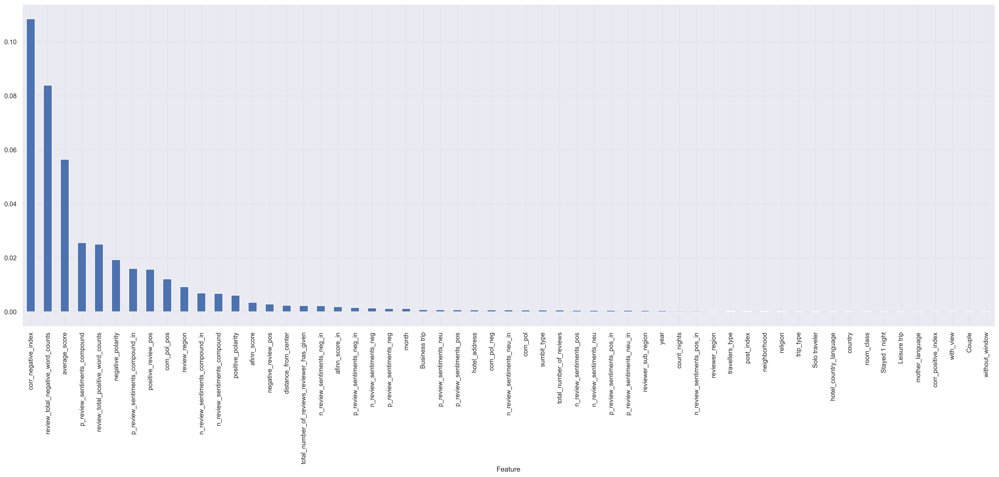

In [120]:
%%time
# Оцениваем важность признаков в графическом виде
# fast_fi = automl.get_feature_scores('fast')
fast_fi = automl.get_feature_scores('accurate', te_data, silent = False)
fast_fi.set_index('Feature')['Importance'].plot.bar(figsize = (30, 10), grid = True)

In [121]:
# Получаем предсказание на валидационой выборке с помощью функции automl.predict
te_pred = automl.predict(te_data)
print(f'Prediction for te_data:\n{te_pred}\nShape = {te_pred.shape}')

Prediction for te_data:
array([[9.951556 ],
       [9.160732 ],
       [8.650551 ],
       ...,
       [9.94014  ],
       [9.961468 ],
       [7.9108353]], dtype=float32)
Shape = (115947, 1)


In [122]:
lightAutoMl = round(metrics.mean_absolute_percentage_error(te_data[TARGET_NAME].values, te_pred.data[:, 0]) * 100, 4)
print(Fore.LIGHTYELLOW_EX,'Для предсказание использовался алгоритм','-',Fore.LIGHTMAGENTA_EX,'LightAutoMl')
print(Fore.LIGHTCYAN_EX,'Результат MAPE:', Fore.LIGHTGREEN_EX, lightAutoMl)

 Для предсказание использовался алгоритм -  LightAutoMl
 Результат MAPE:  11.5732


<a id = '4.4'></a>
<p style = "background-color : DodgerBlue; border-radius: 5px 5px; padding : 10px"><strong>

## Алгоритм - ExtraTreesRegressor

</strong></p> 

In [123]:
model = ExtraTreesRegressor(
  n_estimators=100,
  max_depth=3,
  verbose=1 
)

In [124]:
%%time

# Fit model
model.fit(X_train, y_train)
# Get predictions
y_pred = model.predict(X_test)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   54.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


CPU times: total: 55.5 s
Wall time: 55.5 s


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.2s finished


In [125]:
ext_tree = round(metrics.mean_absolute_percentage_error(y_test, y_pred) * 100, 4)
print(Fore.LIGHTYELLOW_EX,'Для предсказание использовался алгоритм','-',Fore.LIGHTMAGENTA_EX,'ExtraTreesRegressor')
print(Fore.LIGHTCYAN_EX,'Результат MAPE:', Fore.LIGHTGREEN_EX, ext_tree)

 Для предсказание использовался алгоритм -  ExtraTreesRegressor
 Результат MAPE:  14.6292


<a id = '4.5'></a>
<p style = "background-color : DodgerBlue; border-radius: 5px 5px; padding : 10px"><strong>

## Алгоритм - GradientBoostingRegressor

</strong></p> 

In [126]:
model = GradientBoostingRegressor(
  n_estimators=100,
  learning_rate=.1,
  verbose=1 
)

In [127]:
%%time

# Fit model
model.fit(X_train, y_train)
# Get predictions
y_pred = model.predict(X_test)

      Iter       Train Loss   Remaining Time 
         1           2.4954            3.15m
         2           2.3406            3.09m
         3           2.2139            3.04m
         4           2.1008            3.04m
         5           2.0112            3.02m
         6           1.9311            2.99m
         7           1.8637            2.97m
         8           1.8031            2.93m
         9           1.7499            2.89m
        10           1.7052            2.86m
        20           1.4468            2.53m
        30           1.3521            2.20m
        40           1.3087            1.87m
        50           1.2860            1.55m
        60           1.2723            1.23m
        70           1.2628           55.36s
        80           1.2564           36.81s
        90           1.2505           18.39s
       100           1.2455            0.00s
CPU times: total: 3min 4s
Wall time: 3min 4s


In [128]:
gr_boost = round(metrics.mean_absolute_percentage_error(y_test, y_pred) * 100, 4)
print(Fore.LIGHTYELLOW_EX,'Для предсказание использовался алгоритм','-',Fore.LIGHTMAGENTA_EX,'GradientBoostingRegressor')
print(Fore.LIGHTCYAN_EX,'Результат MAPE:', Fore.LIGHTGREEN_EX, gr_boost)

 Для предсказание использовался алгоритм -  GradientBoostingRegressor
 Результат MAPE:  12.051


<a id = '4.6'></a>
<p style = "background-color : DodgerBlue; border-radius: 5px 5px; padding : 10px"><strong>

## Алгоритм - HistGradientBoostingRegressor

</strong></p> 

In [129]:
model = HistGradientBoostingRegressor(
  max_iter=100,
  max_leaf_nodes = None,
  verbose=1 
)

In [130]:
%%time

# Fit model
model.fit(X_train, y_train)
# Get predictions
y_pred = model.predict(X_test)

Binning 0.127 GB of training data: 0.812 s
Binning 0.014 GB of validation data: 0.010 s
Fitting gradient boosted rounds:
[1/100] 1 tree, 10678 leaves, max depth = 32, train loss: 1.17634, val loss: 1.20029, in 7.976s
[2/100] 1 tree, 10698 leaves, max depth = 29, train loss: 1.04233, val loss: 1.09152, in 8.257s
[3/100] 1 tree, 10679 leaves, max depth = 30, train loss: 0.92999, val loss: 1.00294, in 8.293s
[4/100] 1 tree, 10684 leaves, max depth = 32, train loss: 0.83597, val loss: 0.93122, in 7.844s
[5/100] 1 tree, 10677 leaves, max depth = 33, train loss: 0.75628, val loss: 0.87325, in 7.982s
[6/100] 1 tree, 10698 leaves, max depth = 32, train loss: 0.68844, val loss: 0.82577, in 7.834s
[7/100] 1 tree, 10710 leaves, max depth = 34, train loss: 0.63049, val loss: 0.78786, in 8.688s
[8/100] 1 tree, 10687 leaves, max depth = 33, train loss: 0.58047, val loss: 0.75665, in 7.788s
[9/100] 1 tree, 10695 leaves, max depth = 37, train loss: 0.53697, val loss: 0.73098, in 8.197s
[10/100] 1 tree

In [131]:
hist_gradient = round(metrics.mean_absolute_percentage_error(y_test, y_pred) * 100, 4)
print(Fore.LIGHTYELLOW_EX,'Для предсказание использовался алгоритм','-',Fore.LIGHTMAGENTA_EX,'HistGradientBoostingRegressor')
print(Fore.LIGHTCYAN_EX,'Результат MAPE:', Fore.LIGHTGREEN_EX, hist_gradient)

 Для предсказание использовался алгоритм -  HistGradientBoostingRegressor
 Результат MAPE:  11.997


<a id = '4.7'></a>
<p style = "background-color : DodgerBlue; border-radius: 5px 5px; padding : 10px"><strong>

## Алгоритм - AdaBoostRegressor

</strong></p> 

In [132]:
model = AdaBoostRegressor(
  n_estimators=100,
  learning_rate=1.0
)


In [133]:
%%time

# Fit model
model.fit(X_train, y_train)
# Get predictions
y_pred = model.predict(X_test)

CPU times: total: 1min 6s
Wall time: 1min 6s


In [134]:
ada_boost = round(metrics.mean_absolute_percentage_error(y_test, y_pred) * 100, 4)
print(Fore.LIGHTYELLOW_EX,'Для предсказание использовался алгоритм','-',Fore.LIGHTMAGENTA_EX,'AdaBoostRegressor')
print(Fore.LIGHTCYAN_EX,'Результат MAPE:', Fore.LIGHTGREEN_EX, ada_boost)

 Для предсказание использовался алгоритм -  AdaBoostRegressor
 Результат MAPE:  15.0374


<a id = '4.8'></a>
<p style = "background-color : DodgerBlue; border-radius: 5px 5px; padding : 10px"><strong>

## Алгоритм - BaggingRegressor

</strong></p> 

In [135]:
model = BaggingRegressor(
  n_estimators=10,
  verbose = 1
)

In [136]:
%%time

# Fit model
model.fit(X_train, y_train)
# Get predictions
y_pred = model.predict(X_test)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  2.1min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


CPU times: total: 2min 5s
Wall time: 2min 5s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s finished


In [137]:
bagging = round(metrics.mean_absolute_percentage_error(y_test, y_pred) * 100, 4)
print(Fore.LIGHTYELLOW_EX,'Для предсказание использовался алгоритм','-',Fore.LIGHTMAGENTA_EX,'BaggingRegressor')
print(Fore.LIGHTCYAN_EX,'Результат MAPE:', Fore.LIGHTGREEN_EX, bagging)

 Для предсказание использовался алгоритм -  BaggingRegressor
 Результат MAPE:  12.439


In [143]:
models = pd.DataFrame({
    'Model' : [
                'RandomForest',
                'CatBoost',
                'LightAutoMl',
                'ExtraTreesRegressor',
                'GradientBoostingRegressor',
                'HistGradientBoostingRegressor',
                'AdaBoostRegressor',
                'BaggingRegressor',
              ],
    'Score' : [
              random_forest,
              cat_boost,
              lightAutoMl,
              ext_tree,
              gr_boost,
              hist_gradient,
              ada_boost,
              bagging,
              ]
})

models.sort_values(by = 'Score', ascending = False, inplace = True)
models

,Model,Score
6,AdaBoostRegressor,15.037
3,ExtraTreesRegressor,14.629
7,BaggingRegressor,12.439
4,GradientBoostingRegressor,12.051
5,HistGradientBoostingRegressor,11.997
0,RandomForest,11.929
2,LightAutoMl,11.573
1,CatBoost,11.565


<a id = '4.9'></a>
<p style = "background-color : DodgerBlue; border-radius: 5px 5px; padding : 10px"><strong>

## Сравнение использования моделей

</strong></p> 

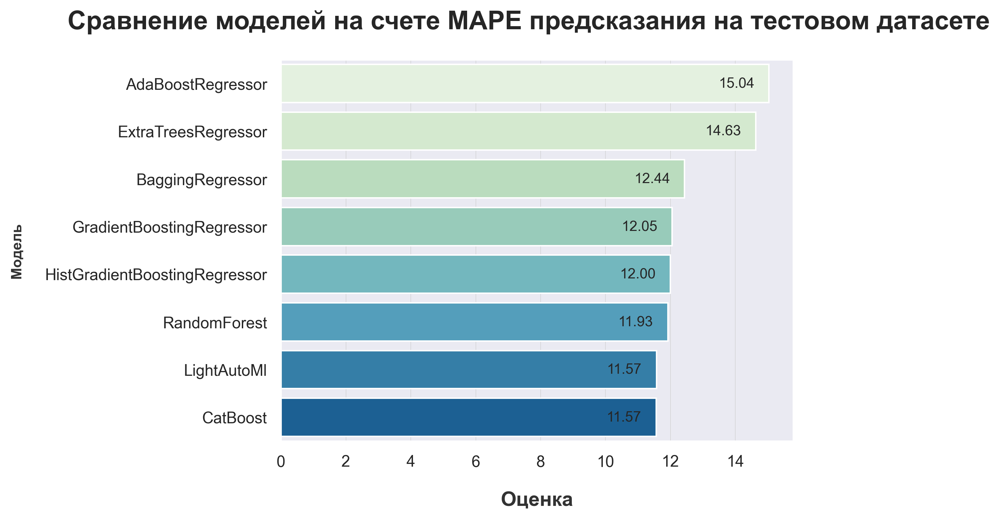

In [183]:

sns.set(rc={"grid.linewidth":.3})
sns.set_style("darkgrid",rc_style)

model_graph = sns.barplot(x=models.Score, y=models.Model,palette='GnBu');

for p in model_graph.patches:
     model_graph.annotate(
    '{:.2f}'.format(p.get_width()), (p.get_width() - 1, p.get_y()+0.4),
    ha='center', va='center', fontsize=10)

model_graph.set_ylabel('Модель', fontsize=10, labelpad = 15,
           fontdict = {'color' : '#323232', 'fontweight' : 600})
model_graph.set_xlabel('Оценка', fontsize=14, labelpad = 15,
           fontdict = {'color' : '#323232', 'fontweight' : 600})

plt.suptitle('Сравнение моделей на счете MAPE предсказания на тестовом датасете', size = 18, weight = 600);


<a id = '5'></a>

<p style = "background-color : DarkGreen; border-radius: 5px 5px; padding : 10px"><strong>

# 5. Заключение

</strong></p>

<span style="color:lightblue">
Достаточно интересный проект. Времени в него угрохал много. 
На данном этапе не хватает знаний об алгоритмах обучения.

Данные в датасете представлены практически "чистые", не надо отвлекаться на мысли, что делать с "некорректностями" в них.

На данный момент я добился первого места в данном соревновании, и если вдруг кто-то читает эти строки и использует мой notebook для разбора полетов, то могу сказать, первое место получено на данном ноутбуке, просто еще немного EDA проделано.

Меня попросили не делится вариантом первого места, и это логично. А то у многих не появится желания разобраться в проекте.
Те же кто захочет улучшить результат, можете смело брать мои идеи и добавлять к своим, или в других вариантах

Результат данного ноутбука сейчас сотавляет около 1.59, что является 6-ой позицией на данный момент.




